# Predictive Modeling of Crop Production in India
## By: Raymond Harris III

## Objective: To create models capable of producing proximal predictions of future crop production gleaned from past crop data.

### India is facing a hunger crisis and with the astonishing population of the nation keeping up with the necessary food production is a top priority. India is also facing water depletion from strains placed on water resources in attempts to meet agricultural demands. For these reasons an accurate predictive model for crop production has never been more beneficial.

#### This project is a continuation of my Mini Project 3 in which I determined the model which yielded the best results for crop production prediction. The models used in this capstone will all be of the neural network type chosen from Mini Project 3 only trained and tested on slightly different data.

#### These models will be used to predict crop production based on a number of factors such as Crop Type, Season, Area, State, Fertilizer, & Pesticide. The crops used for modelling will be cereal crops as India is largely vegetarian and these are the most widely consumed type of crops.

In [1]:
# Install scikeras
!pip install scikeras

In [2]:
# Import Libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline

from neuralprophet import NeuralProphet

import tensorflow as tf
import sklearn
import joblib

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from joblib import parallel_backend

from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasRegressor

import warnings
warnings.simplefilter('ignore')

Importing plotly failed. Interactive plots will not work.
Importing plotly failed. Interactive plots will not work.


In [3]:
# Load Data

csv = "C:\\Users\\rxh07\\Downloads\\IOD\\Capstone\\crop_yield.csv\\crop_yield.csv"
crop_yield = pd.read_csv(csv)
crop_yield

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.4,7024878.38,22882.34,0.796087
1,Arhar/Tur,1997,Kharif,Assam,6637.0,4685,2051.4,631643.29,2057.47,0.710435
2,Castor seed,1997,Kharif,Assam,796.0,22,2051.4,75755.32,246.76,0.238333
3,Coconut,1997,Whole Year,Assam,19656.0,126905000,2051.4,1870661.52,6093.36,5238.051739
4,Cotton(lint),1997,Kharif,Assam,1739.0,794,2051.4,165500.63,539.09,0.420909
...,...,...,...,...,...,...,...,...,...,...
19684,Small millets,1998,Kharif,Nagaland,4000.0,2000,1498.0,395200.00,1160.00,0.500000
19685,Wheat,1998,Rabi,Nagaland,1000.0,3000,1498.0,98800.00,290.00,3.000000
19686,Maize,1997,Kharif,Jammu and Kashmir,310883.0,440900,1356.2,29586735.11,96373.73,1.285000
19687,Rice,1997,Kharif,Jammu and Kashmir,275746.0,5488,1356.2,26242746.82,85481.26,0.016667


In [4]:
# Sort df

crop_yield = crop_yield.sort_values(by = ['Crop_Year', 'Crop', 'Yield'])
crop_yield

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.400000,7024878.38,22882.34,0.796087
57,Arecanut,1997,Whole Year,Kerala,76145.0,93995,3252.400000,7246719.65,23604.95,1.147857
62,Arecanut,1997,Whole Year,Meghalaya,9569.0,12116,3818.200000,910681.73,2966.39,1.245714
27,Arecanut,1997,Whole Year,Karnataka,93100.0,133342,1266.700000,8860327.00,28861.00,1.293571
88,Arecanut,1997,Whole Year,West Bengal,8058.0,12423,1852.900000,766879.86,2497.98,1.691765
...,...,...,...,...,...,...,...,...,...,...
17347,Urad,2020,Kharif,Uttarakhand,12398.0,13282,1313.947826,2400376.78,4587.26,1.120769
17348,Urad,2020,Summer,Uttarakhand,58.0,69,1313.947826,11229.38,21.46,1.193333
17349,Wheat,2020,Rabi,Uttarakhand,297189.0,937003,1313.947826,57538762.29,109959.93,2.216154
17351,other oilseeds,2020,Rabi,Uttarakhand,30.0,21,1313.947826,5808.30,11.10,0.690000


In [5]:
# Reset index

crop_yield.reset_index(inplace = True, drop = True)
crop_yield

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.400000,7024878.38,22882.34,0.796087
1,Arecanut,1997,Whole Year,Kerala,76145.0,93995,3252.400000,7246719.65,23604.95,1.147857
2,Arecanut,1997,Whole Year,Meghalaya,9569.0,12116,3818.200000,910681.73,2966.39,1.245714
3,Arecanut,1997,Whole Year,Karnataka,93100.0,133342,1266.700000,8860327.00,28861.00,1.293571
4,Arecanut,1997,Whole Year,West Bengal,8058.0,12423,1852.900000,766879.86,2497.98,1.691765
...,...,...,...,...,...,...,...,...,...,...
19684,Urad,2020,Kharif,Uttarakhand,12398.0,13282,1313.947826,2400376.78,4587.26,1.120769
19685,Urad,2020,Summer,Uttarakhand,58.0,69,1313.947826,11229.38,21.46,1.193333
19686,Wheat,2020,Rabi,Uttarakhand,297189.0,937003,1313.947826,57538762.29,109959.93,2.216154
19687,other oilseeds,2020,Rabi,Uttarakhand,30.0,21,1313.947826,5808.30,11.10,0.690000


In [6]:
# Check nulls
crop_yield.isnull().sum()

Crop               0
Crop_Year          0
Season             0
State              0
Area               0
Production         0
Annual_Rainfall    0
Fertilizer         0
Pesticide          0
Yield              0
dtype: int64

In [7]:
#Get info
crop_yield.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19689 entries, 0 to 19688
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Crop             19689 non-null  object 
 1   Crop_Year        19689 non-null  int64  
 2   Season           19689 non-null  object 
 3   State            19689 non-null  object 
 4   Area             19689 non-null  float64
 5   Production       19689 non-null  int64  
 6   Annual_Rainfall  19689 non-null  float64
 7   Fertilizer       19689 non-null  float64
 8   Pesticide        19689 non-null  float64
 9   Yield            19689 non-null  float64
dtypes: float64(5), int64(2), object(3)
memory usage: 1.5+ MB


In [8]:
# Describe
crop_yield.describe().T

,count,mean,std,min,25%,50%,75%,max
Crop_Year,19689.0,2.009128e+03,6.498099e+00,1997.00,2004.00,2010.00,2.015000e+03,2.020000e+03
Area,19689.0,1.799266e+05,7.328287e+05,0.50,1390.00,9317.00,7.511200e+04,5.080810e+07
Production,19689.0,1.643594e+07,2.630568e+08,0.00,1393.00,13804.00,1.227180e+05,6.326000e+09
Annual_Rainfall,19689.0,1.437755e+03,8.169096e+02,301.30,940.70,1247.60,1.643700e+03,6.552700e+03
Fertilizer,19689.0,2.410331e+07,9.494600e+07,54.17,188014.62,1234957.44,1.000385e+07,4.835407e+09
Pesticide,19689.0,4.884835e+04,2.132874e+05,0.09,356.70,2421.90,2.004170e+04,1.575051e+07
Yield,19689.0,7.995401e+01,8.783062e+02,0.00,0.60,1.03,2.388889e+00,2.110500e+04


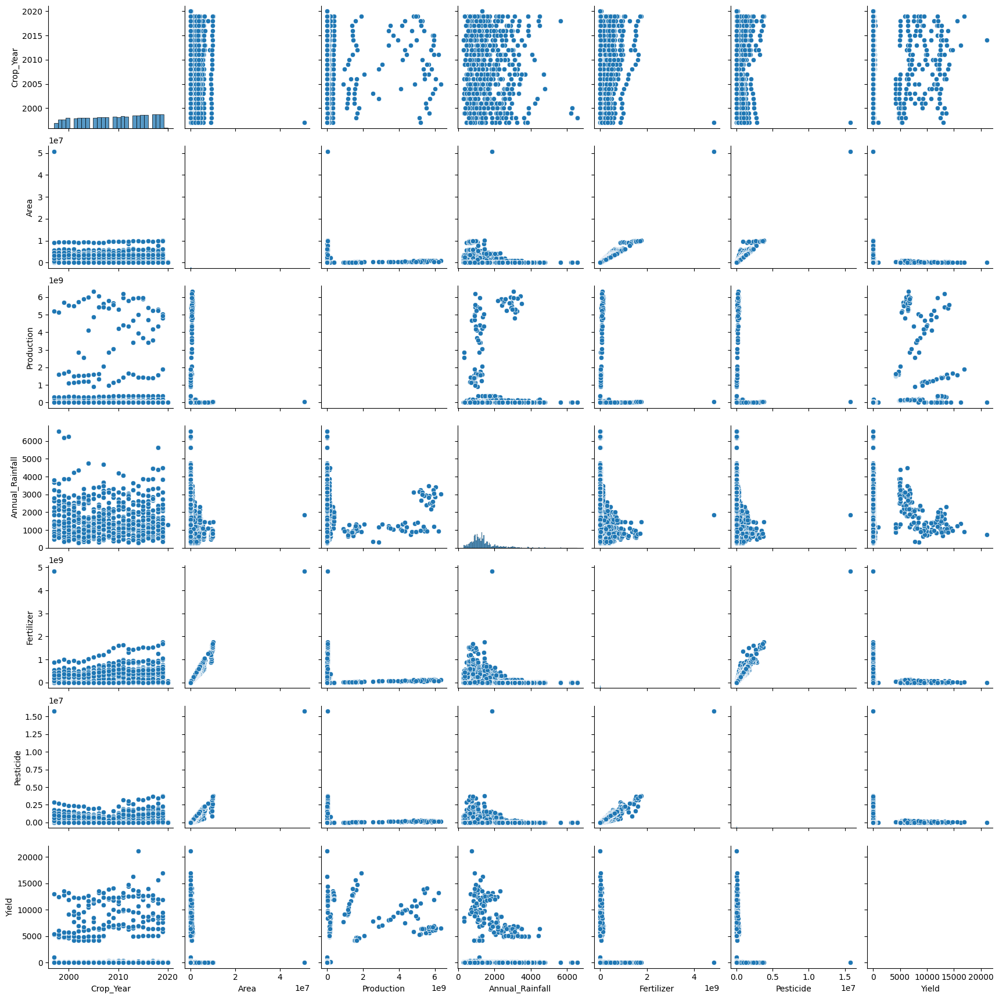

In [9]:
# Pairplot
sns.pairplot(crop_yield)

In [9]:
# Checking Season Names
crop_yield['Season'].unique()

array(['Whole Year ', 'Kharif     ', 'Winter     ', 'Autumn     ',
       'Summer     ', 'Rabi       '], dtype=object)

In [10]:
# Stripping whitespace
crop_yield = crop_yield.applymap(lambda x: x.strip() if isinstance(x, str) else x)
crop_yield['Season'].unique()

array(['Whole Year', 'Kharif', 'Winter', 'Autumn', 'Summer', 'Rabi'],
      dtype=object)

In [11]:
# Removing problematic outlier
crop_yield[crop_yield['Yield'] == 21105.0].index

Index([13561], dtype='int64')

In [12]:
# Removing problematic outlier
crop_yield = crop_yield.drop(index = 13561)

In [13]:
# Creating df with only cereal crops
cereal_crops = ['Barley', 'Rice', 'Maize', 'Wheat', 'Small millets', 'Other Cereals']
cereal_crop_yield = crop_yield[crop_yield['Crop'].isin(cereal_crops)]
cereal_crop_yield.reset_index(inplace = True, drop = True)
cereal_crop_yield

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Barley,1997,Rabi,Bihar,42838.0,44140,1303.700000,4076892.46,13279.78,1.040000
1,Barley,1997,Rabi,Sikkim,1310.0,1510,2804.100000,124672.70,406.10,1.155000
2,Barley,1997,Rabi,Madhya Pradesh,91200.0,110500,1189.100000,8679504.00,28272.00,1.347097
3,Barley,1997,Whole Year,West Bengal,6116.0,5034,1852.900000,582059.72,1895.96,1.680000
4,Barley,1997,Rabi,Uttar Pradesh,337037.0,747044,473.900000,32075811.29,104481.47,2.046329
...,...,...,...,...,...,...,...,...,...,...
3640,Other Cereals,2020,Rabi,Uttarakhand,411.0,333,1313.947826,79573.71,152.07,0.808000
3641,Rice,2020,Kharif,Uttarakhand,241936.0,669372,1313.947826,46841228.96,89516.32,2.093077
3642,Rice,2020,Summer,Uttarakhand,15315.0,55057,1313.947826,2965137.15,5666.55,3.563333
3643,Small millets,2020,Kharif,Uttarakhand,44769.0,65289,1313.947826,8667726.09,16564.53,1.480909


In [14]:
# removing problematic outlier
maize_crop_yield = cereal_crop_yield[cereal_crop_yield['Crop'] == 'Maize']
print(maize_crop_yield.max())

print(crop_yield[crop_yield['Yield'] == 989.87].index)
cereal_crop_yield[cereal_crop_yield['Yield'] == 989.87].index

Crop                     Maize
Crop_Year                 2020
Season                  Winter
State              West Bengal
Area                 1516103.0
Production             5150460
Annual_Rainfall         6552.7
Fertilizer         260405851.3
Pesticide            560958.11
Yield                   989.87
dtype: object
Index([185], dtype='int64')


Index([38], dtype='int64')

In [15]:
# removing problematic outlier from both dataframes
print(crop_yield.iloc[185])
crop_yield = crop_yield.drop(index = 185)
if 185 in crop_yield.index:
    print("Index 185 exists in the DataFrame.")
else:
    print("Index 185 does not exist in the DataFrame.")

print(cereal_crop_yield.iloc[38])
cereal_crop_yield = cereal_crop_yield.drop(index = 38)
if 38 in cereal_crop_yield.index:
    print("Index 38 exists in the DataFrame.")
else:
    print("Index 38 does not exist in the DataFrame.")

Crop                     Maize
Crop_Year                 1997
Season                  Autumn
State              Maharashtra
Area                      21.0
Production               19695
Annual_Rainfall         1156.1
Fertilizer             1998.57
Pesticide                 6.51
Yield                   989.87
Name: 185, dtype: object
Index 185 does not exist in the DataFrame.
Crop                     Maize
Crop_Year                 1997
Season                  Autumn
State              Maharashtra
Area                      21.0
Production               19695
Annual_Rainfall         1156.1
Fertilizer             1998.57
Pesticide                 6.51
Yield                   989.87
Name: 38, dtype: object
Index 38 does not exist in the DataFrame.


In [16]:
# Resetting the index
crop_yield.reset_index(drop = True, inplace = True)

cereal_crop_yield.reset_index(drop = True, inplace = True)

crop_yield.head(10)

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.4,7024878.38,22882.34,0.796087
1,Arecanut,1997,Whole Year,Kerala,76145.0,93995,3252.4,7246719.65,23604.95,1.147857
2,Arecanut,1997,Whole Year,Meghalaya,9569.0,12116,3818.2,910681.73,2966.39,1.245714
3,Arecanut,1997,Whole Year,Karnataka,93100.0,133342,1266.7,8860327.00,28861.00,1.293571
4,Arecanut,1997,Whole Year,West Bengal,8058.0,12423,1852.9,766879.86,2497.98,1.691765
5,Arhar/Tur,1997,Kharif,Andhra Pradesh,313900.0,55600,927.5,29873863.00,97309.00,0.197727
6,Arhar/Tur,1997,Winter,Odisha,116553.0,23305,1496.6,11092349.01,36131.43,0.198929
7,Arhar/Tur,1997,Autumn,Odisha,25621.0,6487,1496.6,2438350.57,7942.51,0.202778
8,Arhar/Tur,1997,Summer,Odisha,86559.0,16414,1496.6,8237820.03,26833.29,0.216786
9,Arhar/Tur,1997,Kharif,Karnataka,421810.0,98473,1266.7,40143657.70,130761.10,0.268235


## Exploratory Data Analysis (Graphing)

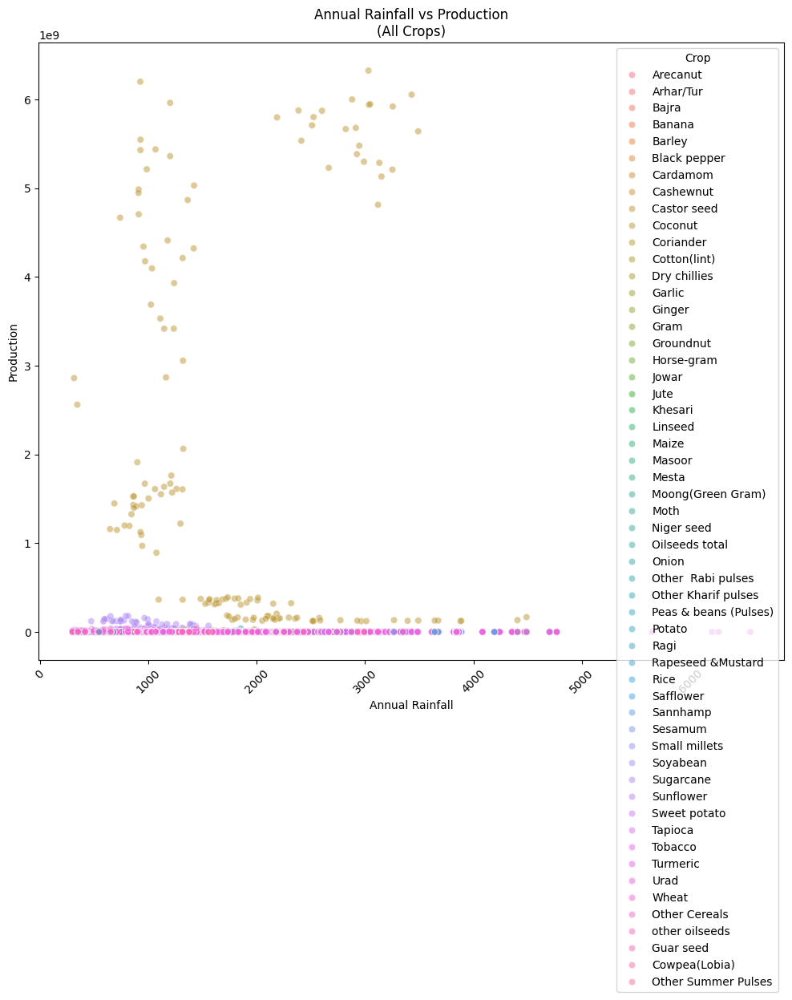

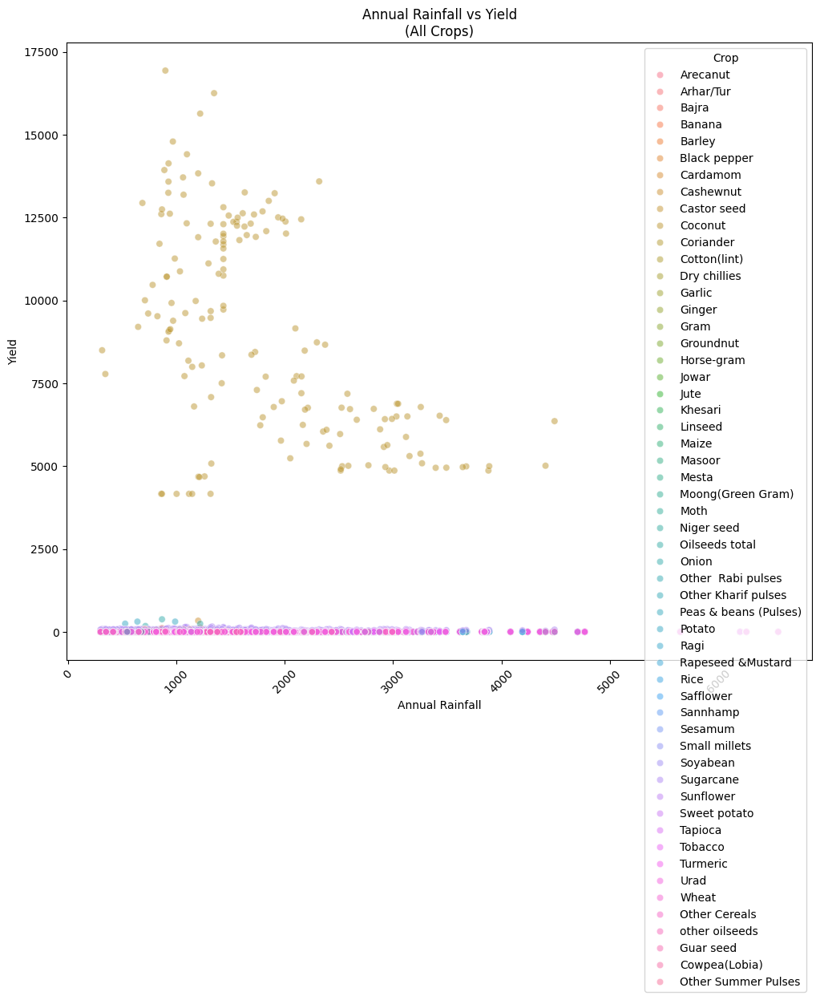

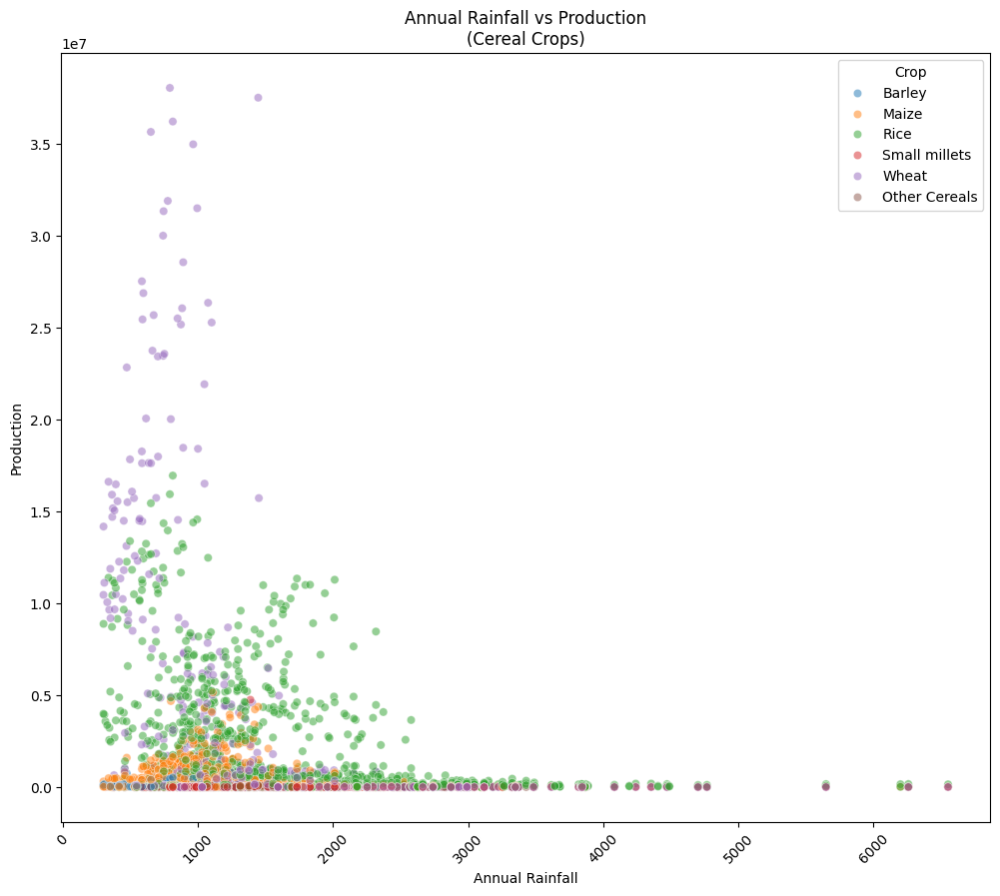

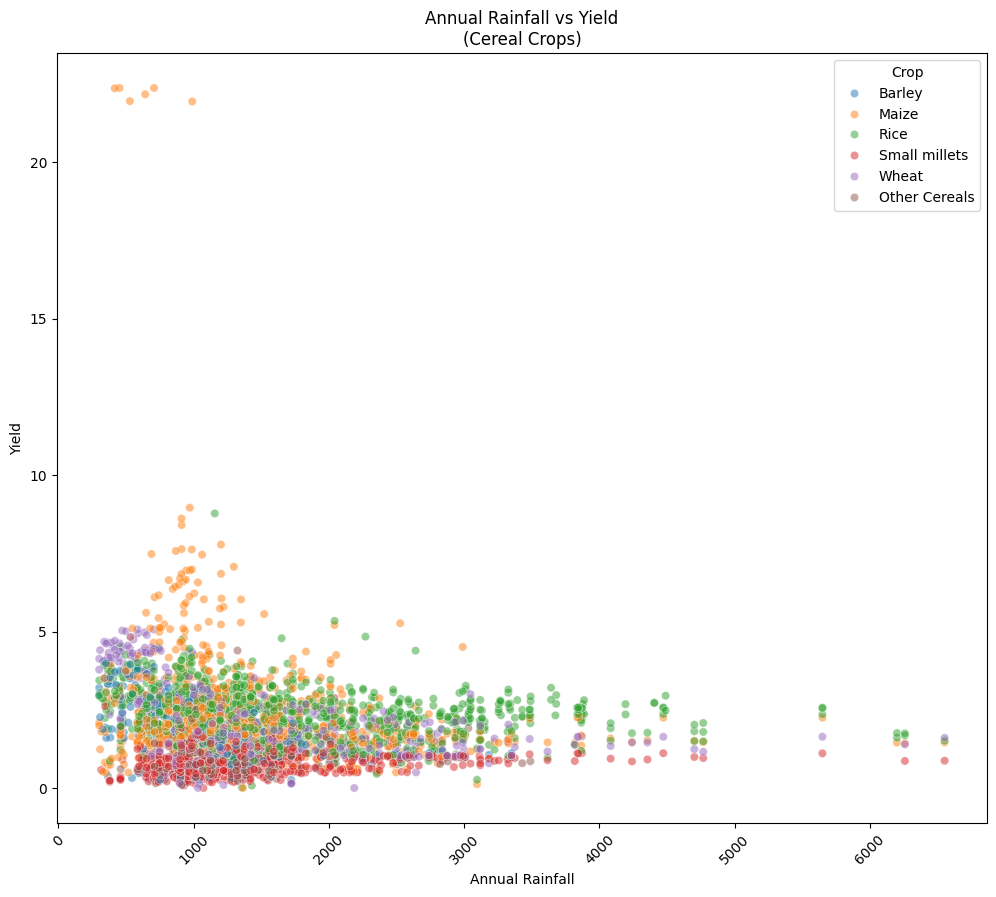

In [17]:
# Plotting rainfall vs production(All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Annual_Rainfall', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Annual Rainfall vs Production\n(All Crops)')
plt.xlabel('Annual Rainfall')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting rainfall vs yield (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Annual_Rainfall', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Annual Rainfall vs Yield\n(All Crops)')
plt.xlabel('Annual Rainfall')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

# Plotting rainfall vs production (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Annual_Rainfall', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Annual Rainfall vs Production\n(Cereal Crops)')
plt.xlabel('Annual Rainfall')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting rainfall vs yield (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Annual_Rainfall', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Annual Rainfall vs Yield\n(Cereal Crops)')
plt.xlabel('Annual Rainfall')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()


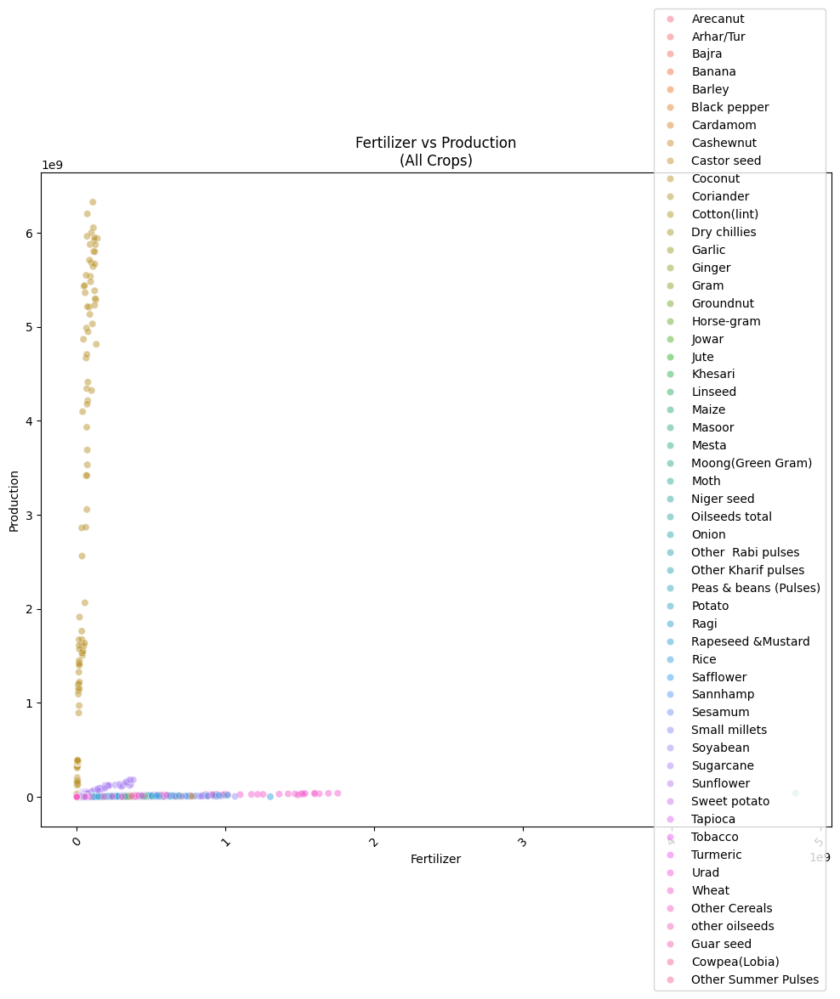

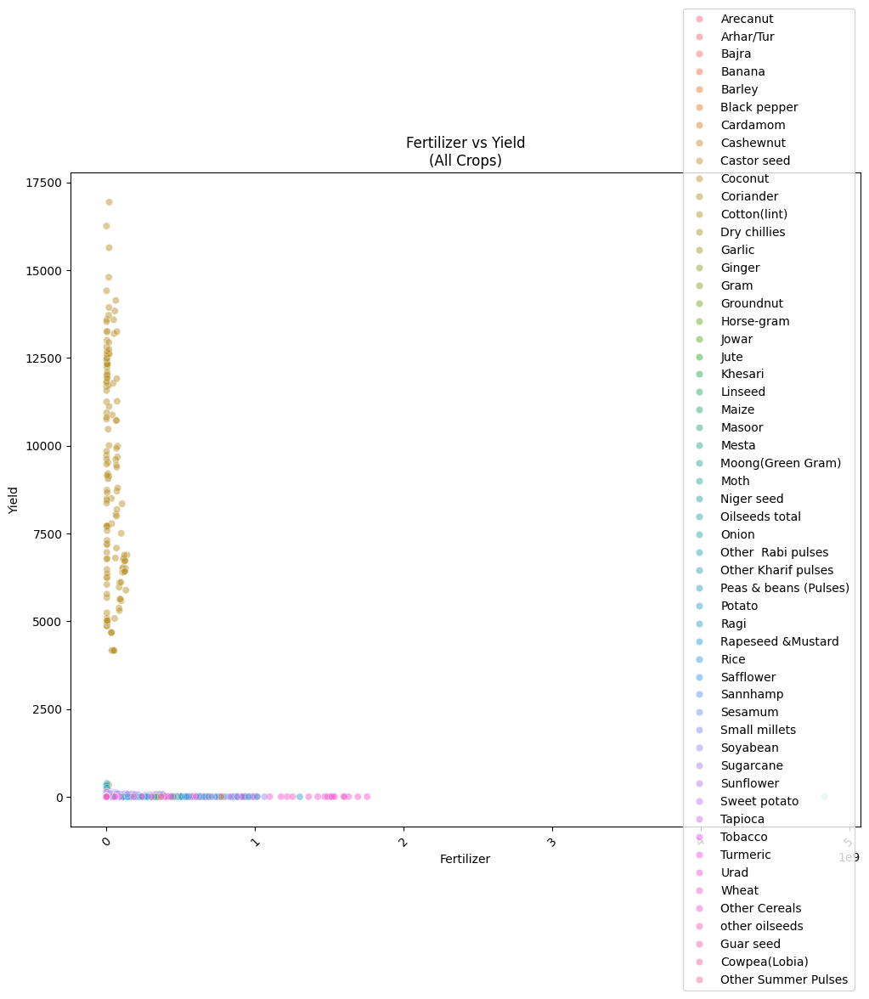

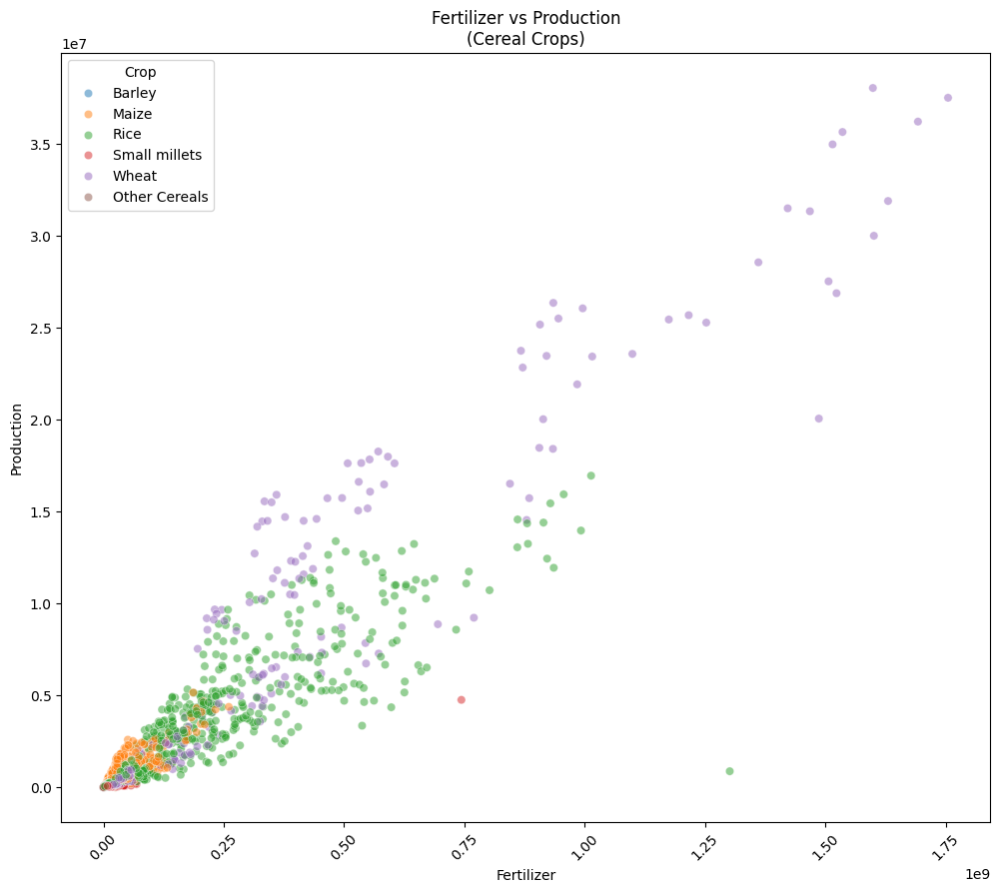

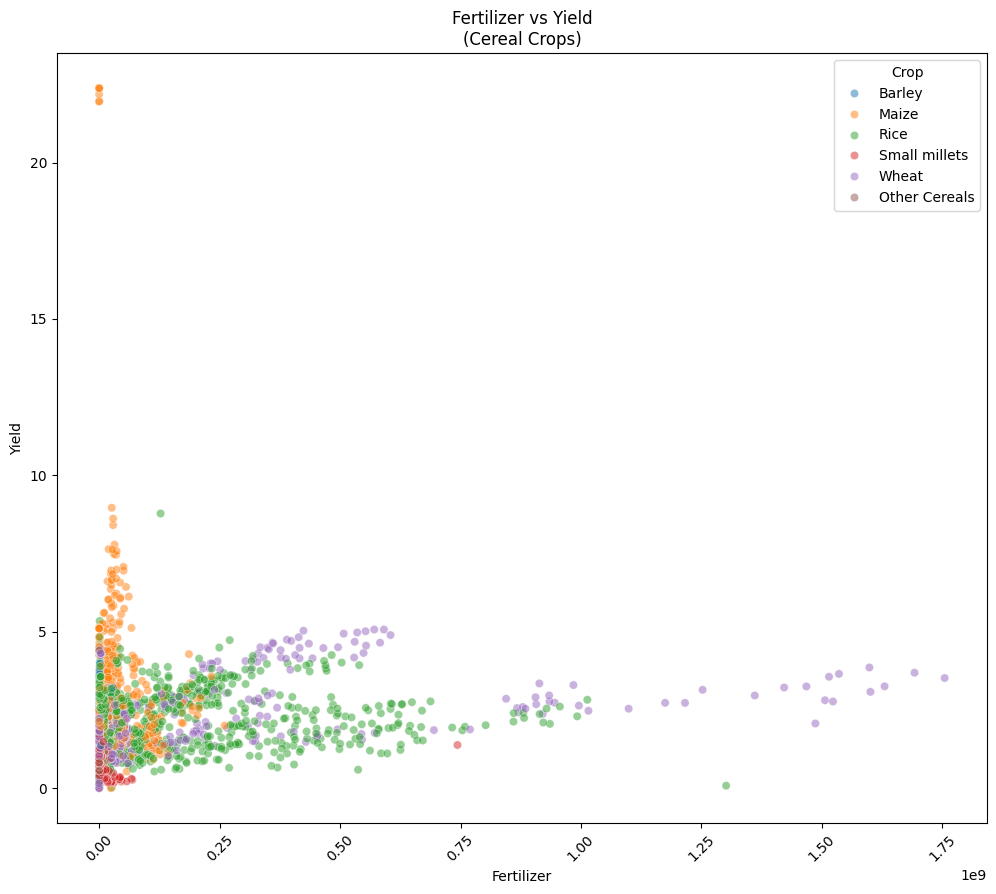

In [18]:
# Plotting fertilizer vs production (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Fertilizer', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Fertilizer vs Production\n(All Crops)')
plt.xlabel('Fertilizer')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.legend(loc = 'center right')
plt.show()

# Plotting fertilizer vs yield (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Fertilizer', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Fertilizer vs Yield\n(All Crops)')
plt.xlabel('Fertilizer')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.legend(loc = 'center right')
plt.show()

# Plotting fertilizer vs production (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Fertilizer', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Fertilizer vs Production\n(Cereal Crops)')
plt.xlabel('Fertilizer')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting fertilizer vs yield (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Fertilizer', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Fertilizer vs Yield\n(Cereal Crops)')
plt.xlabel('Fertilizer')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()


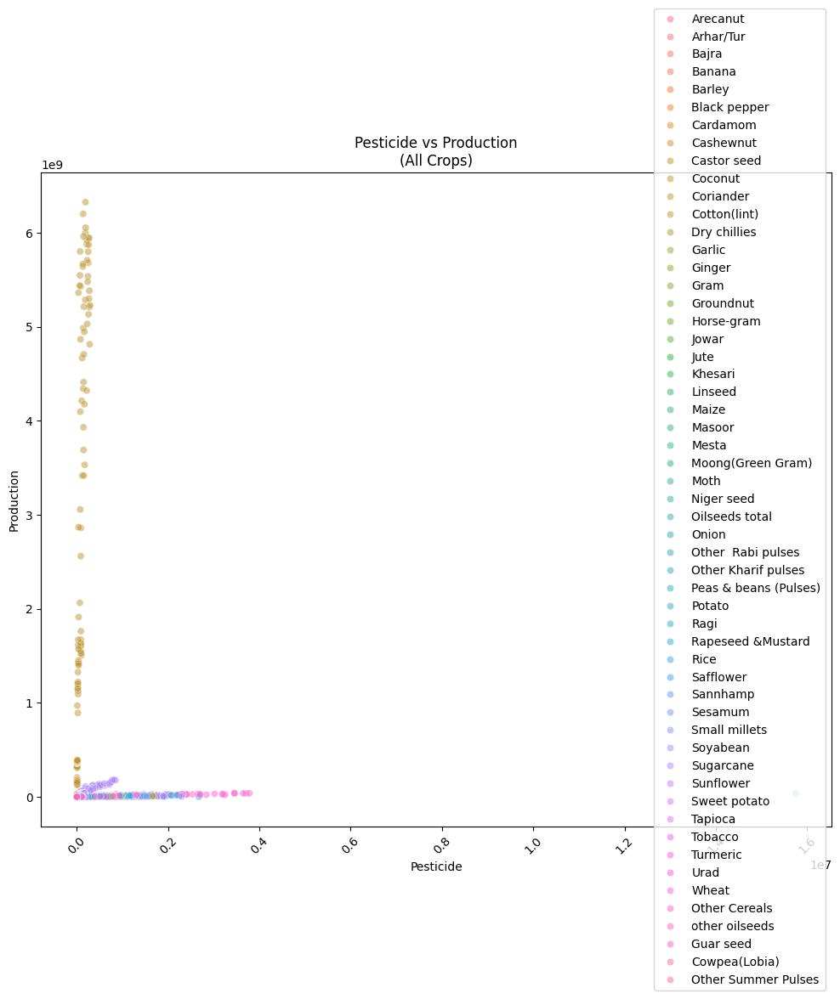

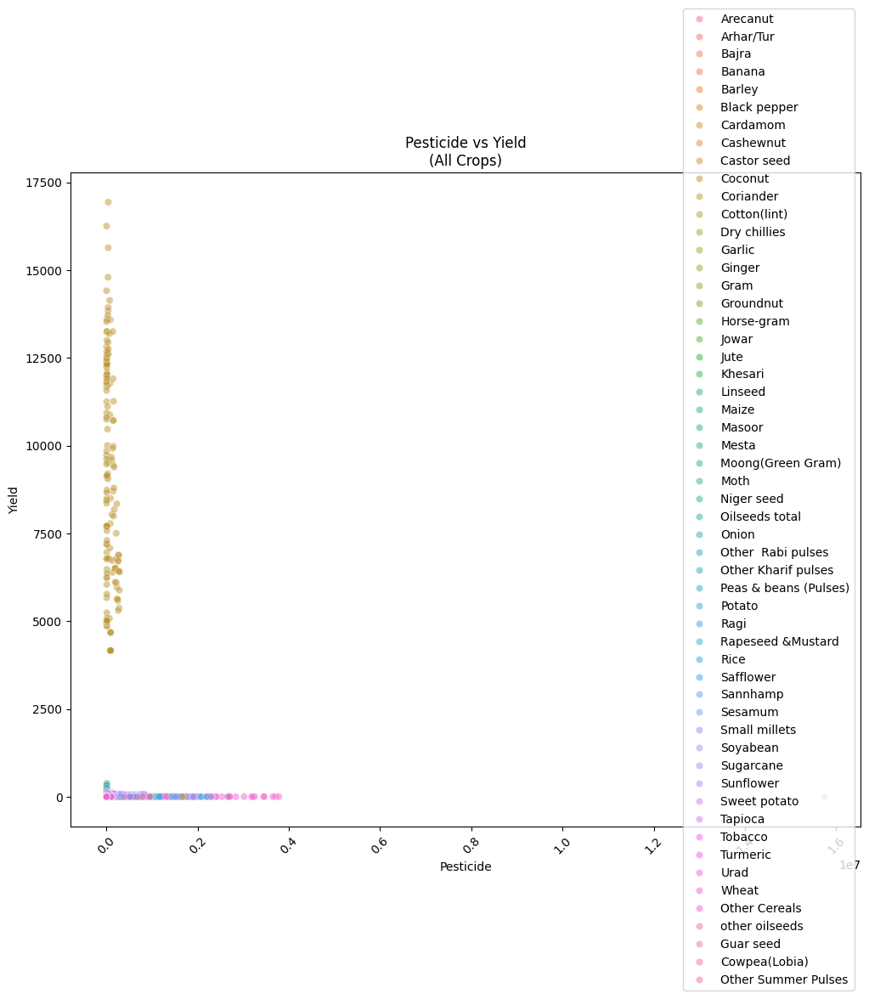

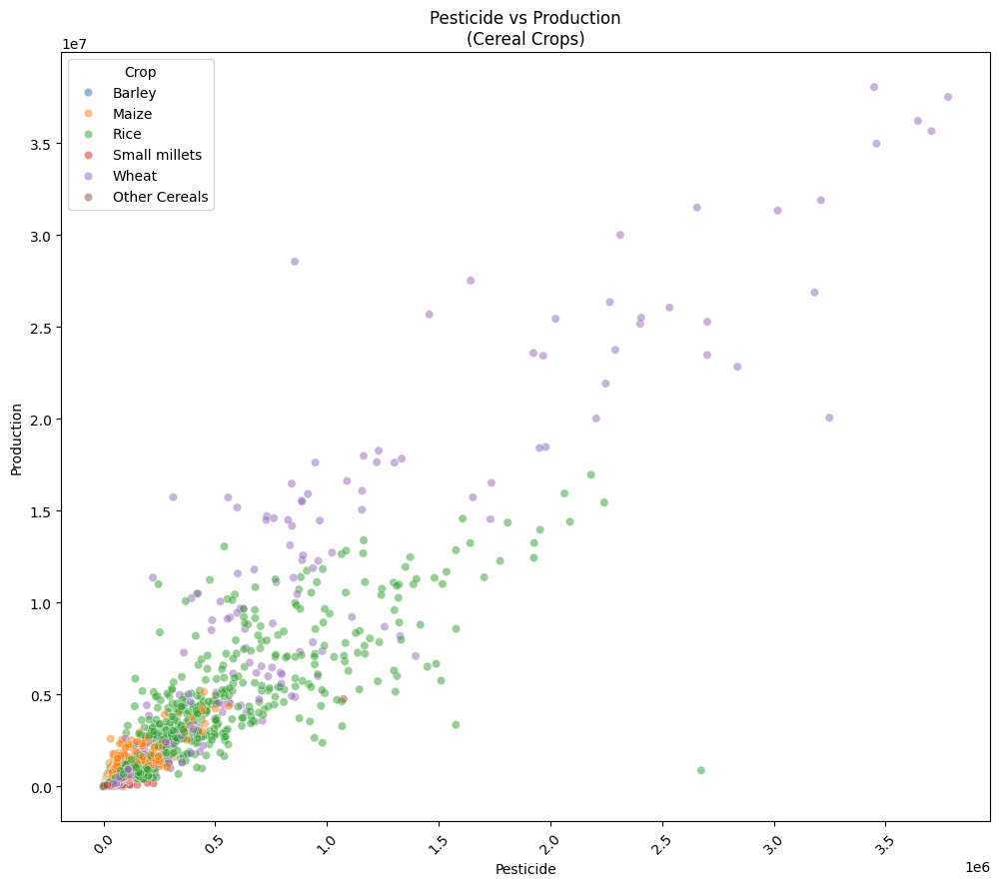

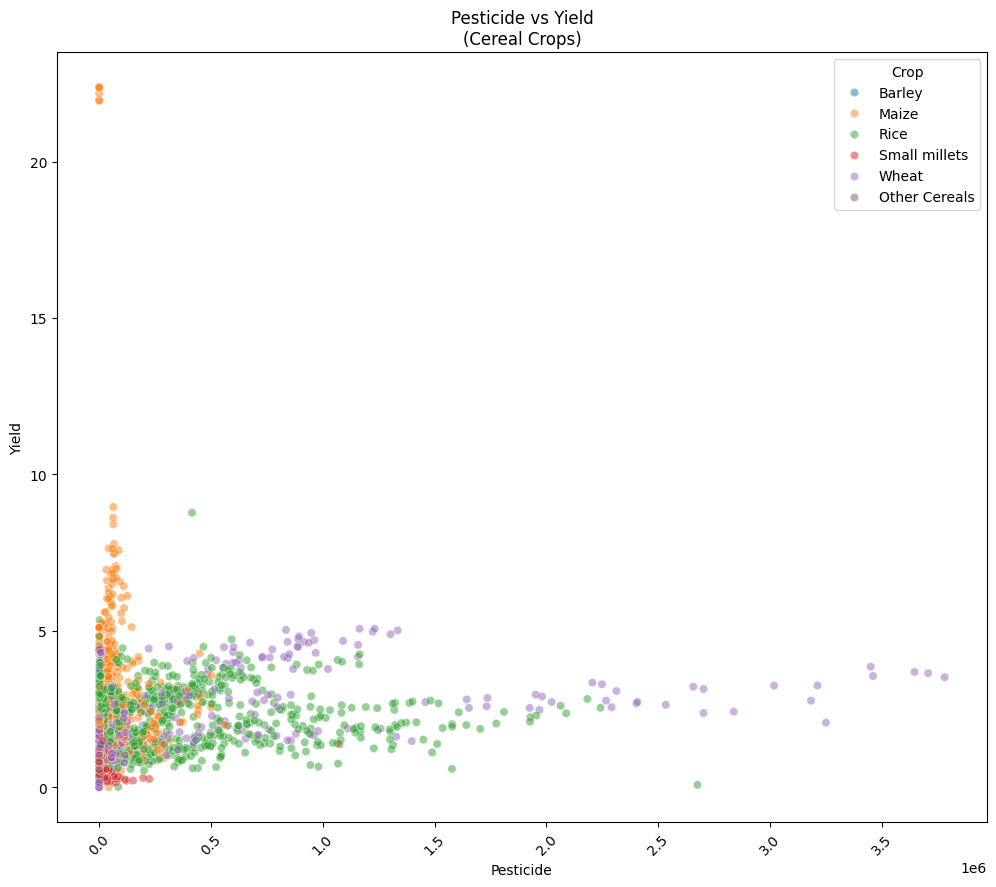

In [19]:
# Plotting pesticide vs production (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Pesticide', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Pesticide vs Production\n(All Crops)')
plt.xlabel('Pesticide')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.legend(loc = 'center right')
plt.show()

# Plotting pesticide vs yield (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Pesticide', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Pesticide vs Yield\n(All Crops)')
plt.xlabel('Pesticide')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.legend(loc = 'center right')
plt.show()

# Plotting pesticide vs production (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Pesticide', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Pesticide vs Production\n(Cereal Crops)')
plt.xlabel('Pesticide')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting pesticide vs yield (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Pesticide', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Pesticide vs Yield\n(Cereal Crops)')
plt.xlabel('Pesticide')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

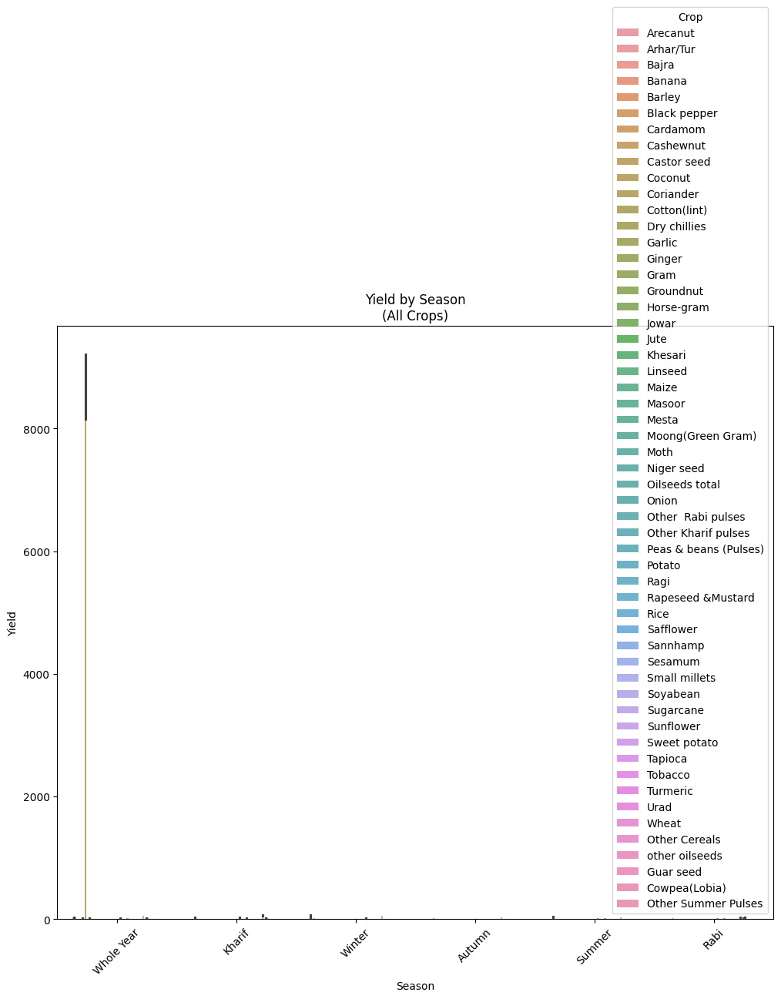

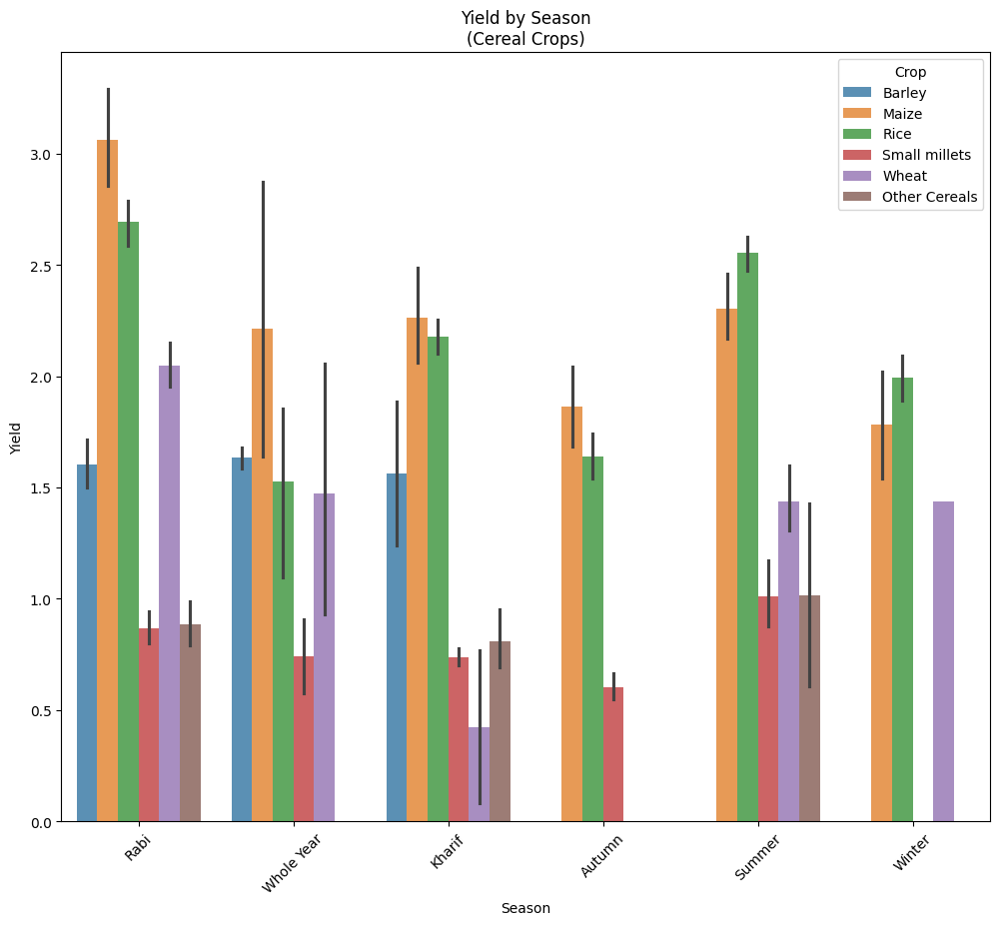

In [20]:
# Plotting yield by season (All Crops)
plt.figure(figsize = (12, 10))
sns.barplot(data = crop_yield, x = 'Season', y = 'Yield', hue = 'Crop', alpha = 0.8)
plt.title('Yield by Season\n(All Crops)')
plt.xlabel('Season')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

# Plotting yield by season (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.barplot(data = cereal_crop_yield, x = 'Season', y = 'Yield', hue = 'Crop', alpha = 0.8)
plt.title('Yield by Season\n(Cereal Crops)')
plt.xlabel('Season')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

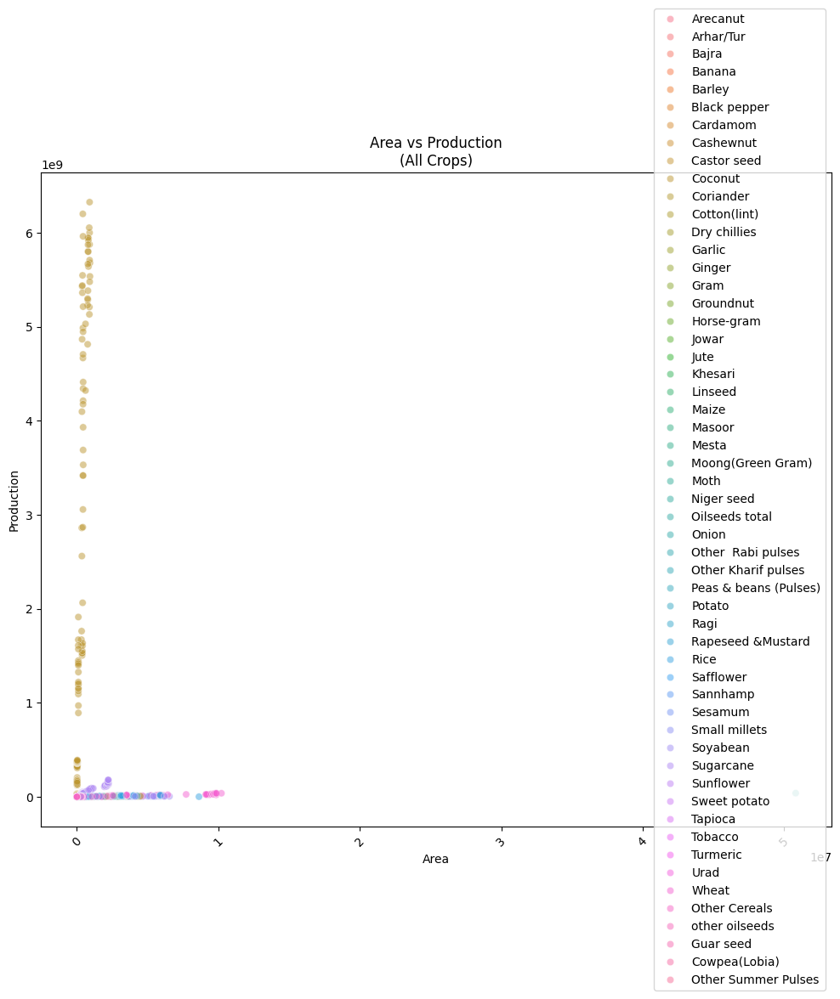

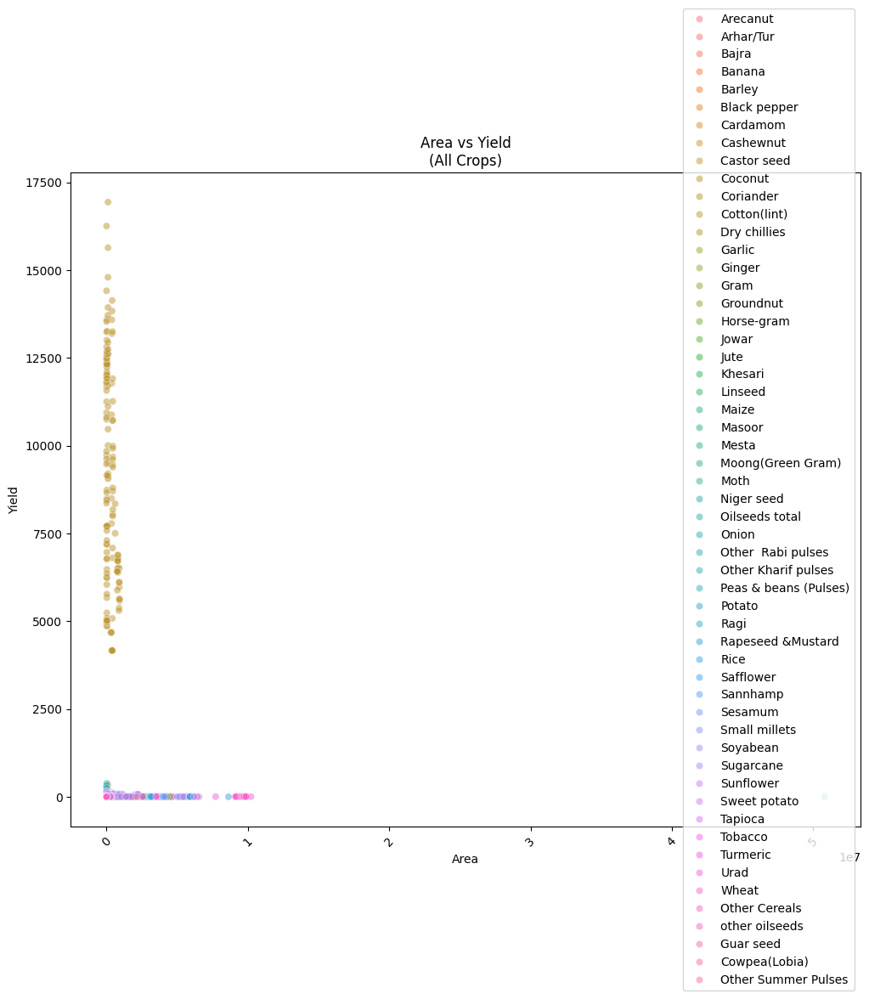

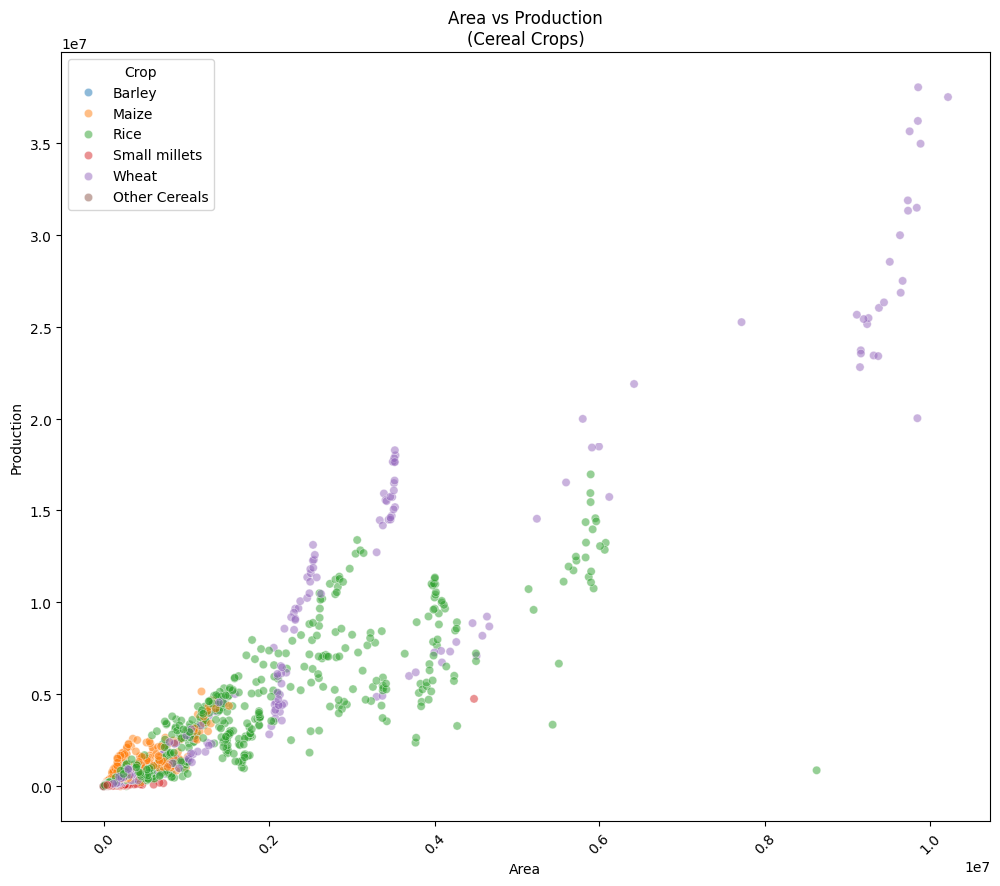

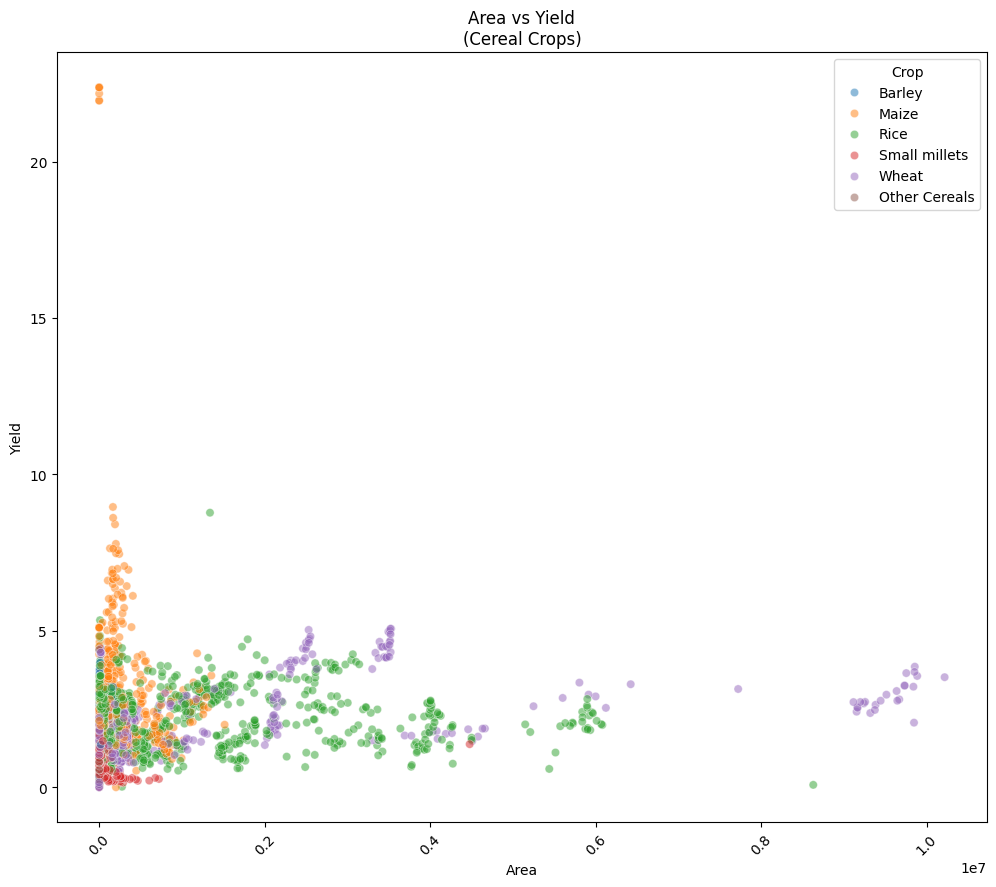

In [21]:
# Plotting Area vs Production (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Area', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Area vs Production\n(All Crops)')
plt.xlabel('Area')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.legend(loc = 'center right')
plt.show()

# Plotting Area vs Yield (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Area', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Area vs Yield\n(All Crops)')
plt.xlabel('Area')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.legend(loc = 'center right')
plt.show()

# Plotting Area vs Production (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Area', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Area vs Production\n(Cereal Crops)')
plt.xlabel('Area')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting Area vs Yield (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Area', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Area vs Yield\n(Cereal Crops)')
plt.xlabel('Area')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()


In [22]:
# Removing outliers

lower_percentile = 0.05
upper_percentile = 0.95
lower_bound = crop_yield['Yield'].quantile(lower_percentile)
upper_bound = crop_yield['Yield'].quantile(upper_percentile)
crop_yield = crop_yield[(crop_yield['Yield'] >= lower_bound) & (crop_yield['Yield'] <= upper_bound)]

lower_percentile = 0.05
upper_percentile = 0.95
lower_bound = crop_yield['Production'].quantile(lower_percentile)
upper_bound = crop_yield['Production'].quantile(upper_percentile)
crop_yield = crop_yield[(crop_yield['Production'] >= lower_bound) & (crop_yield['Production'] <= upper_bound)]

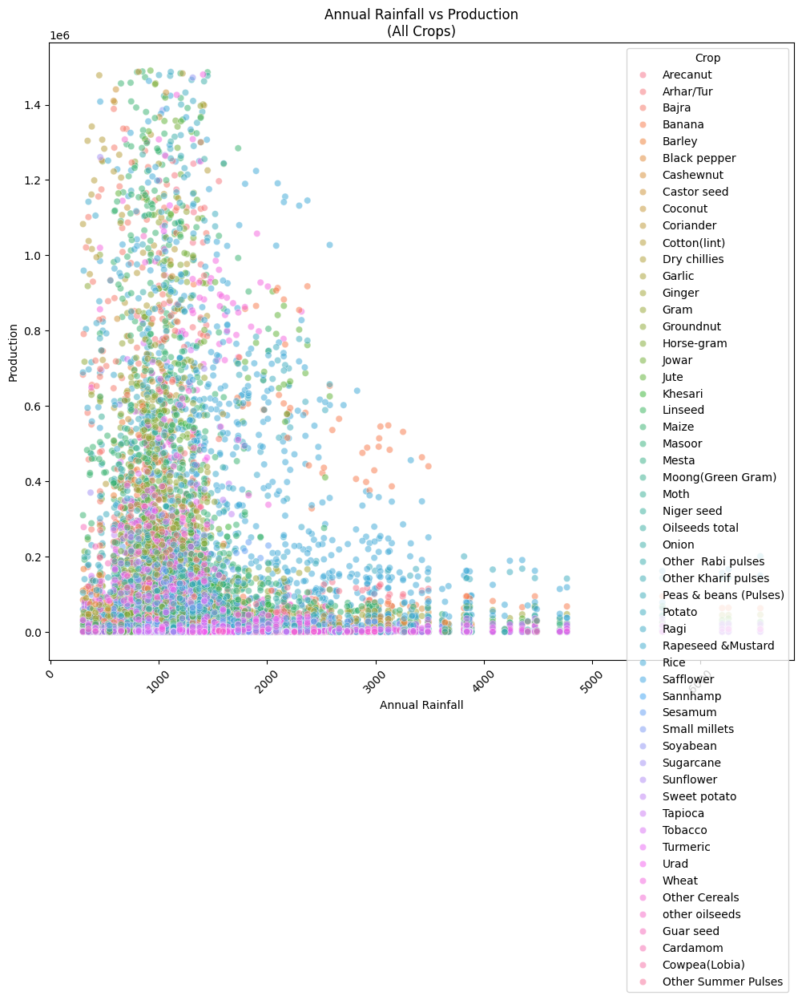

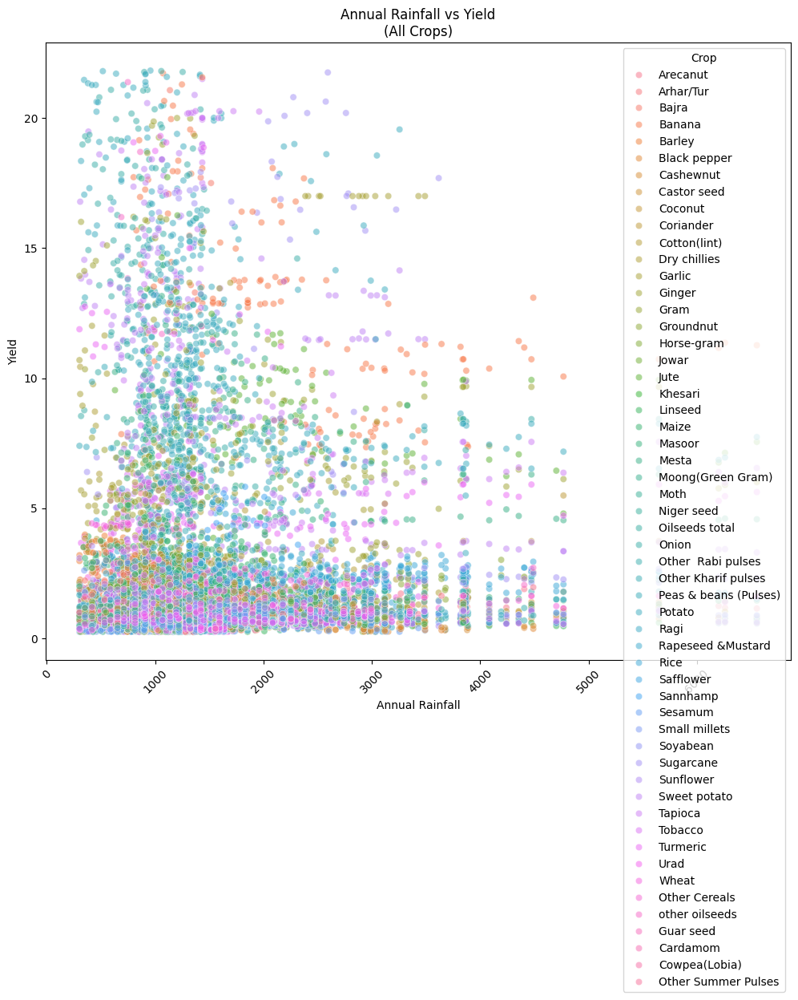

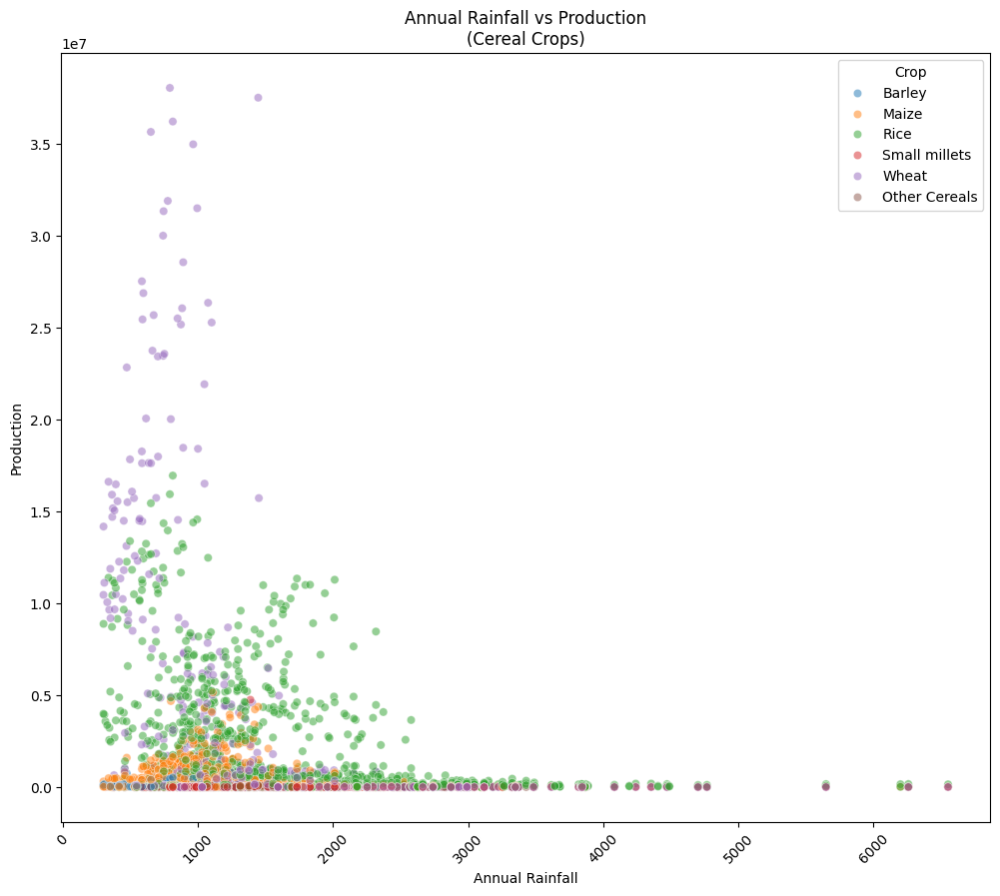

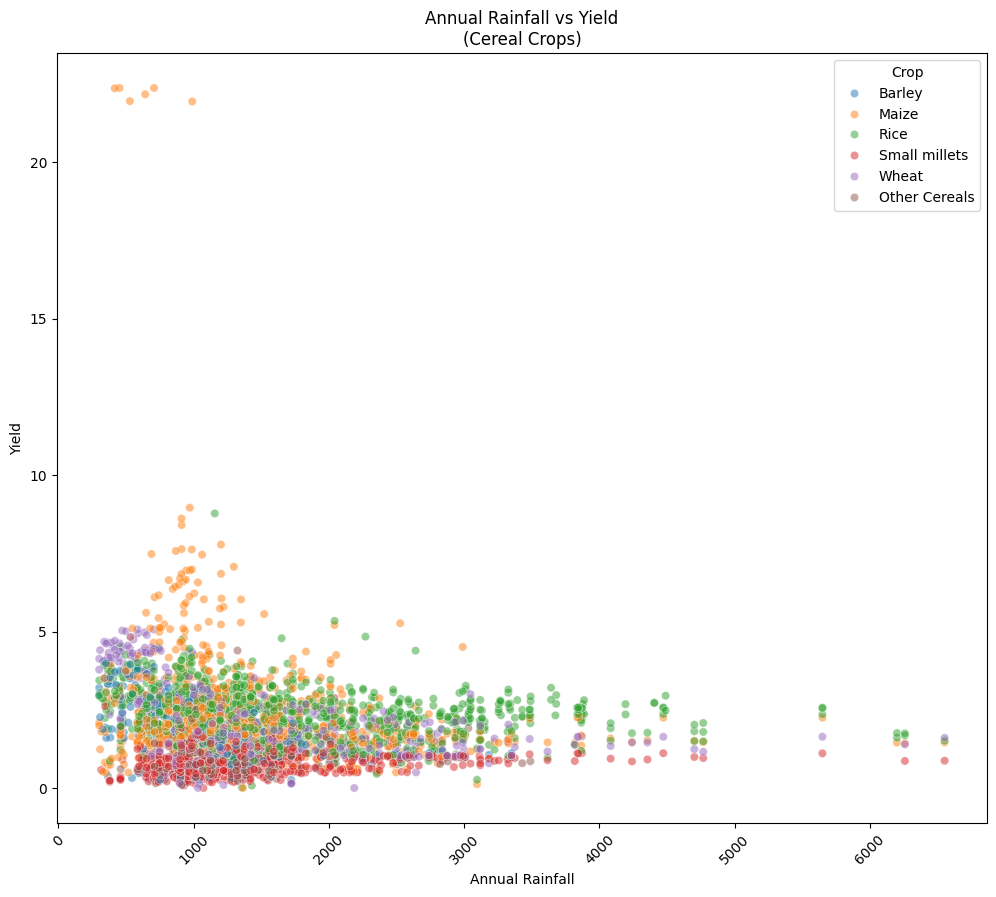

In [23]:
# Plotting rainfall vs production without outliers (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Annual_Rainfall', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Annual Rainfall vs Production\n(All Crops)')
plt.xlabel('Annual Rainfall')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting rainfall vs yield without outliers (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Annual_Rainfall', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Annual Rainfall vs Yield\n(All Crops)')
plt.xlabel('Annual Rainfall')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

# Plotting rainfall vs production without outliers (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Annual_Rainfall', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Annual Rainfall vs Production\n(Cereal Crops)')
plt.xlabel('Annual Rainfall')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting rainfall vs yield without outliers (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Annual_Rainfall', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Annual Rainfall vs Yield\n(Cereal Crops)')
plt.xlabel('Annual Rainfall')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()


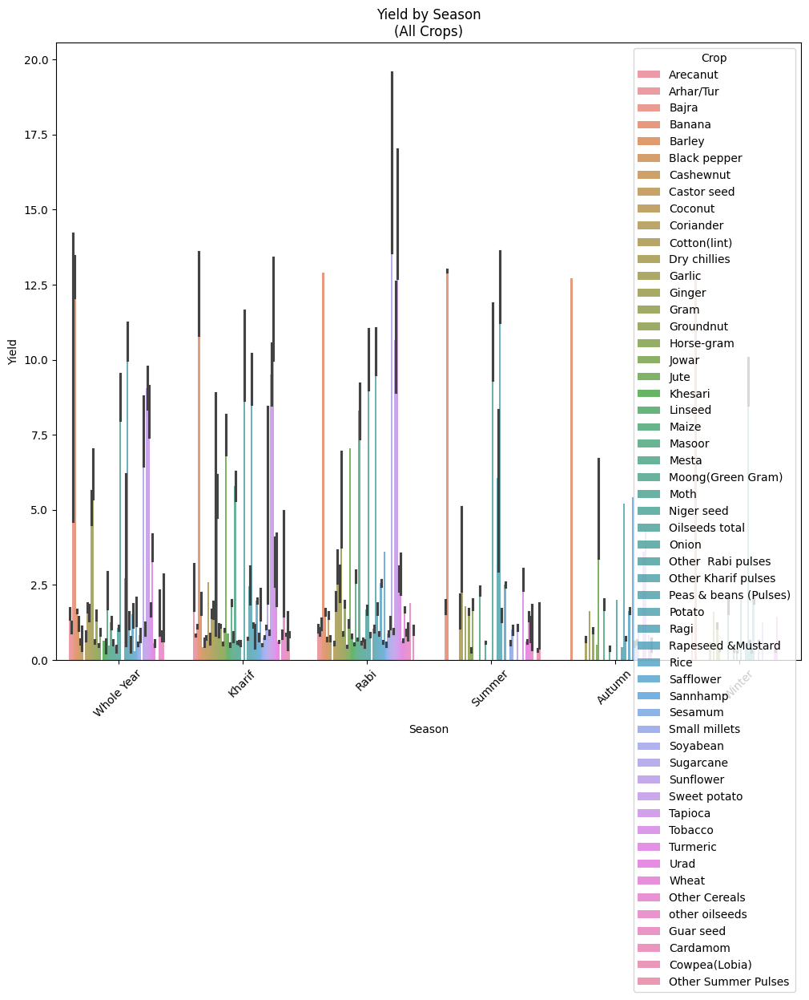

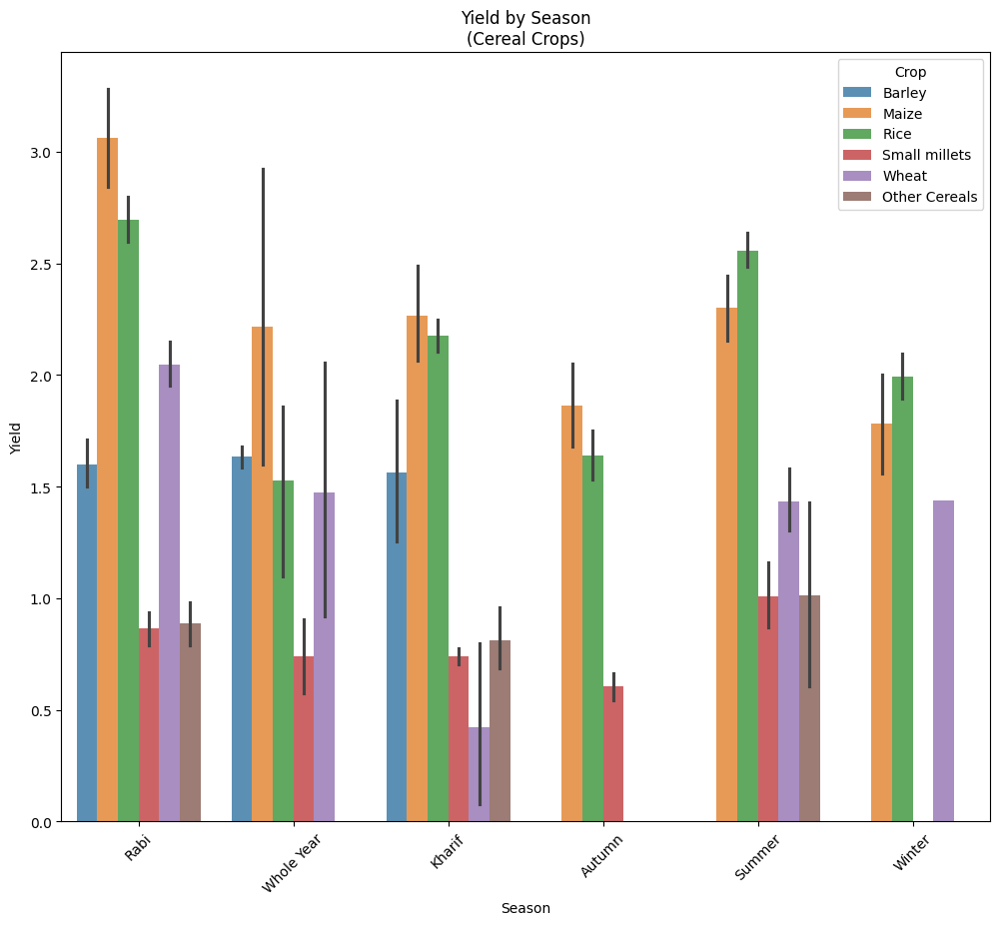

In [24]:
# Plotting yield by season without outliers (All Crops)
plt.figure(figsize = (12, 10))
sns.barplot(data = crop_yield, x = 'Season', y = 'Yield', hue = 'Crop', alpha = 0.8)
plt.title('Yield by Season\n(All Crops)')
plt.xlabel('Season')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

# Plotting yield by season without outliers (Cereal Crops)
plt.figure(figsize = (12,10))
sns.barplot(data = cereal_crop_yield, x = 'Season', y = 'Yield', hue = 'Crop', alpha = 0.8)
plt.title('Yield by Season\n(Cereal Crops)')
plt.xlabel('Season')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

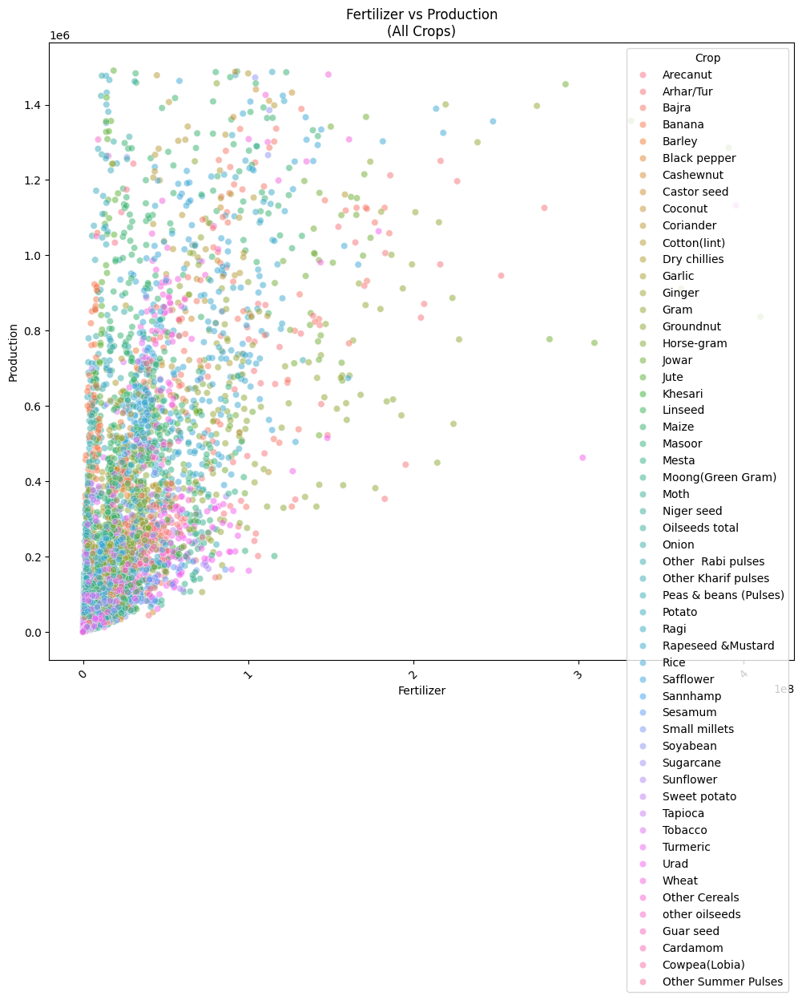

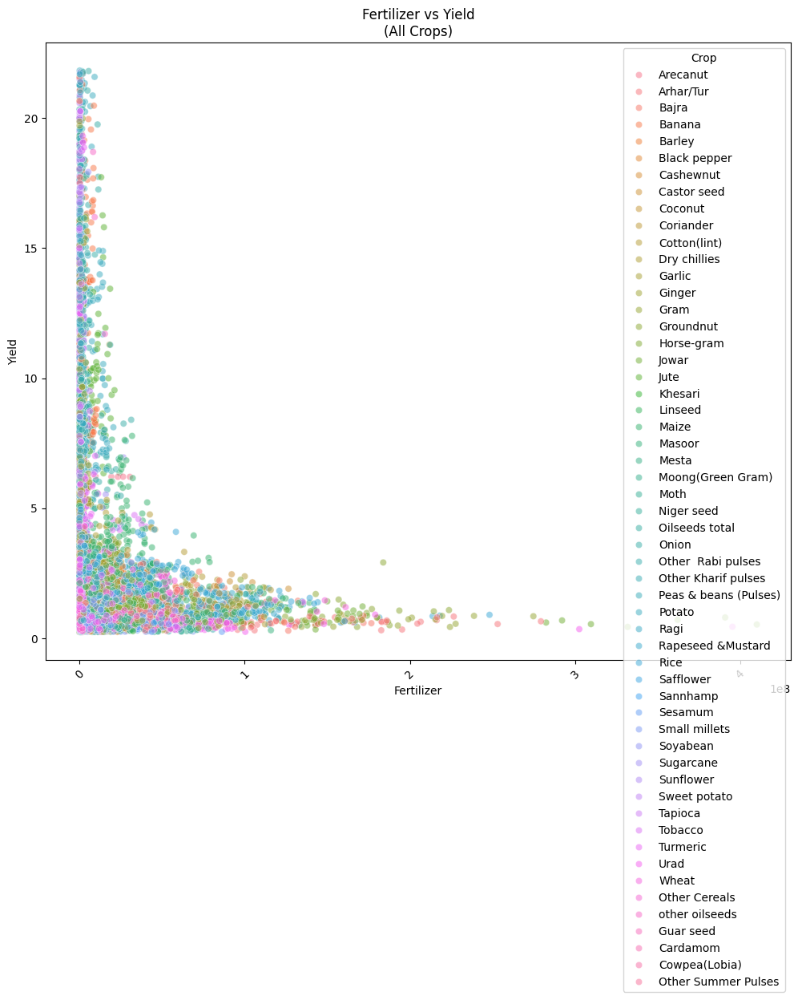

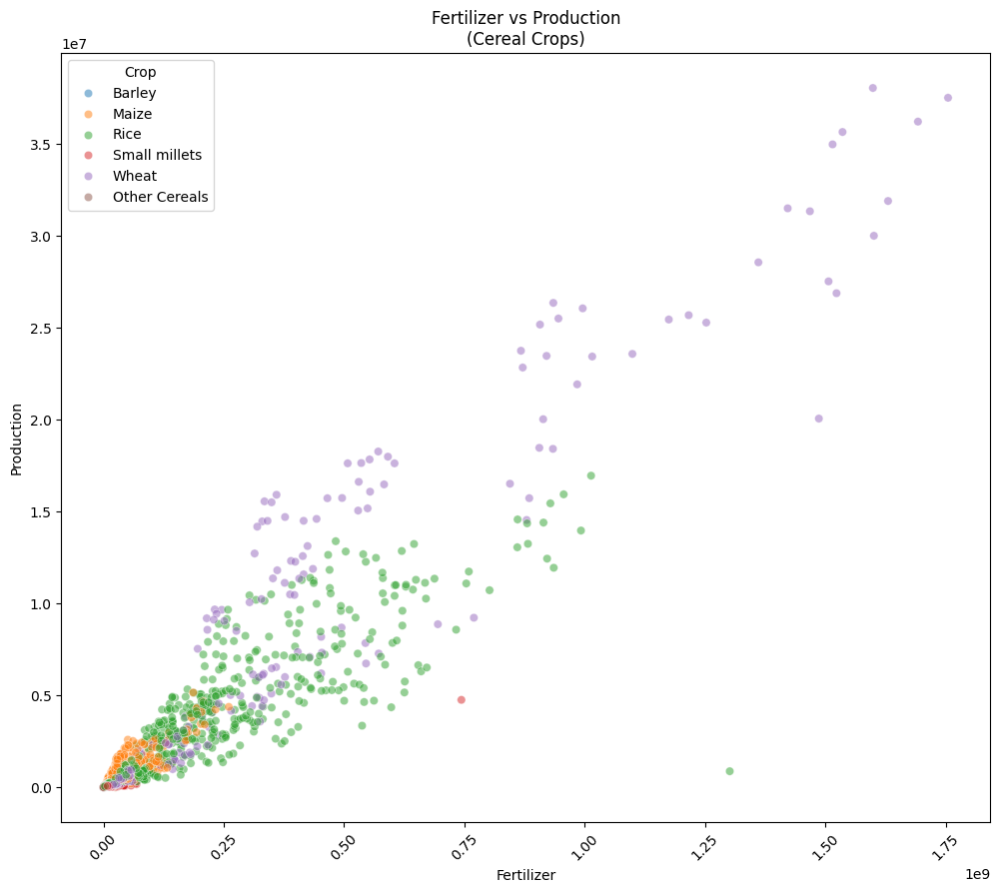

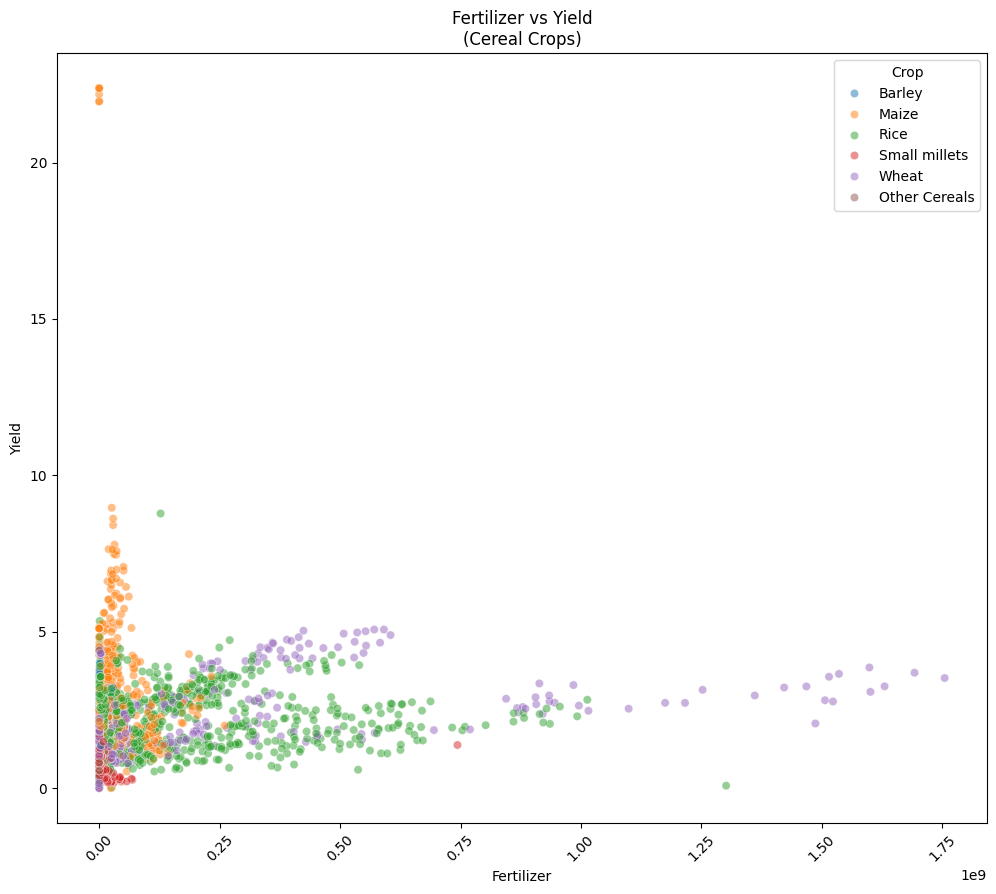

In [25]:
# Plotting fertilizer by production without outliers (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Fertilizer', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Fertilizer vs Production\n(All Crops)')
plt.xlabel('Fertilizer')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting fertilizer by yield without outliers (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Fertilizer', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Fertilizer vs Yield\n(All Crops)')
plt.xlabel('Fertilizer')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

# Plotting fertilizer by production without outliers (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Fertilizer', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Fertilizer vs Production\n(Cereal Crops)')
plt.xlabel('Fertilizer')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting fertilizer by yield without outliers (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Fertilizer', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Fertilizer vs Yield\n(Cereal Crops)')
plt.xlabel('Fertilizer')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()


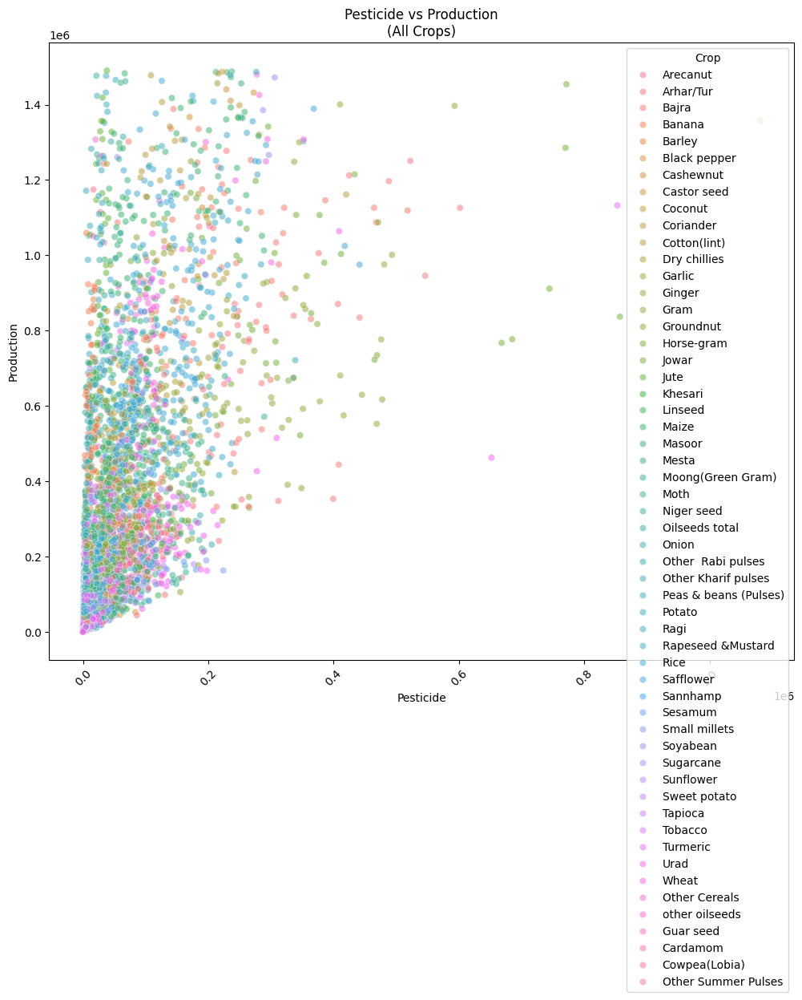

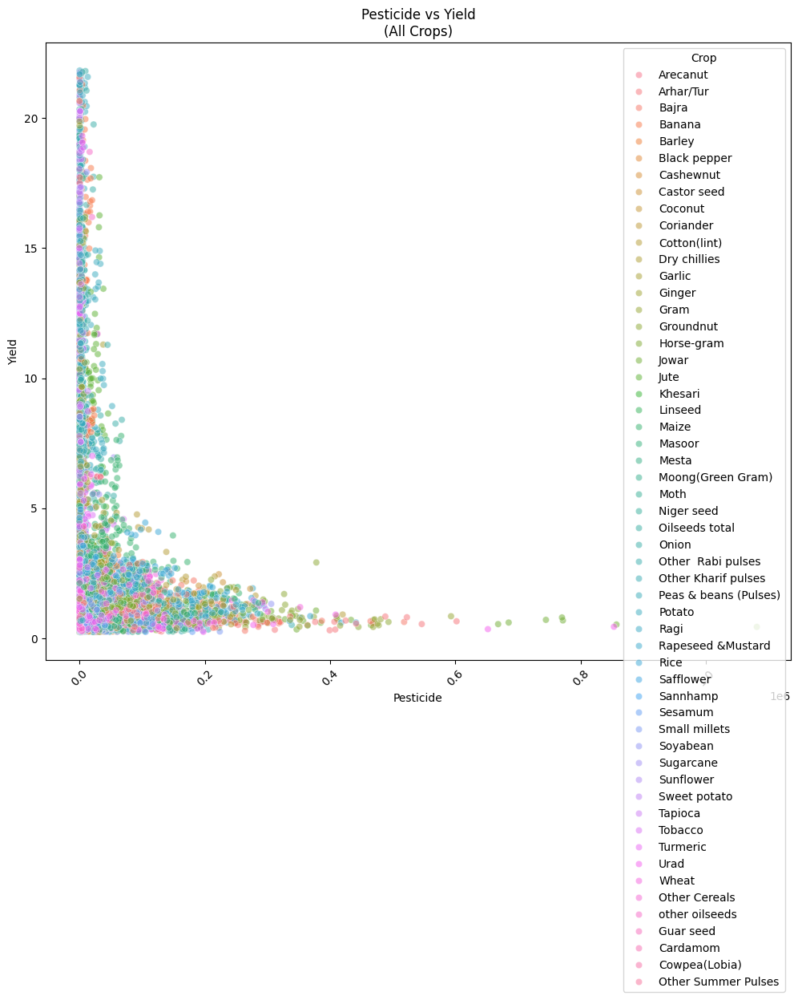

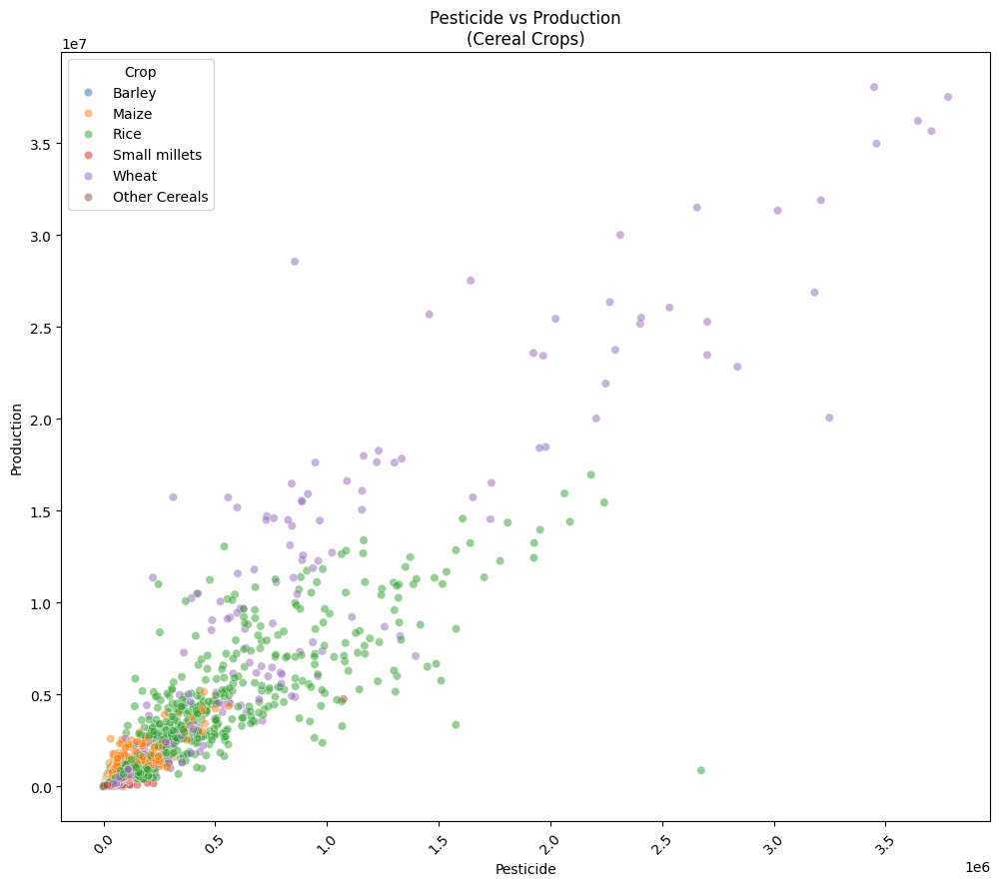

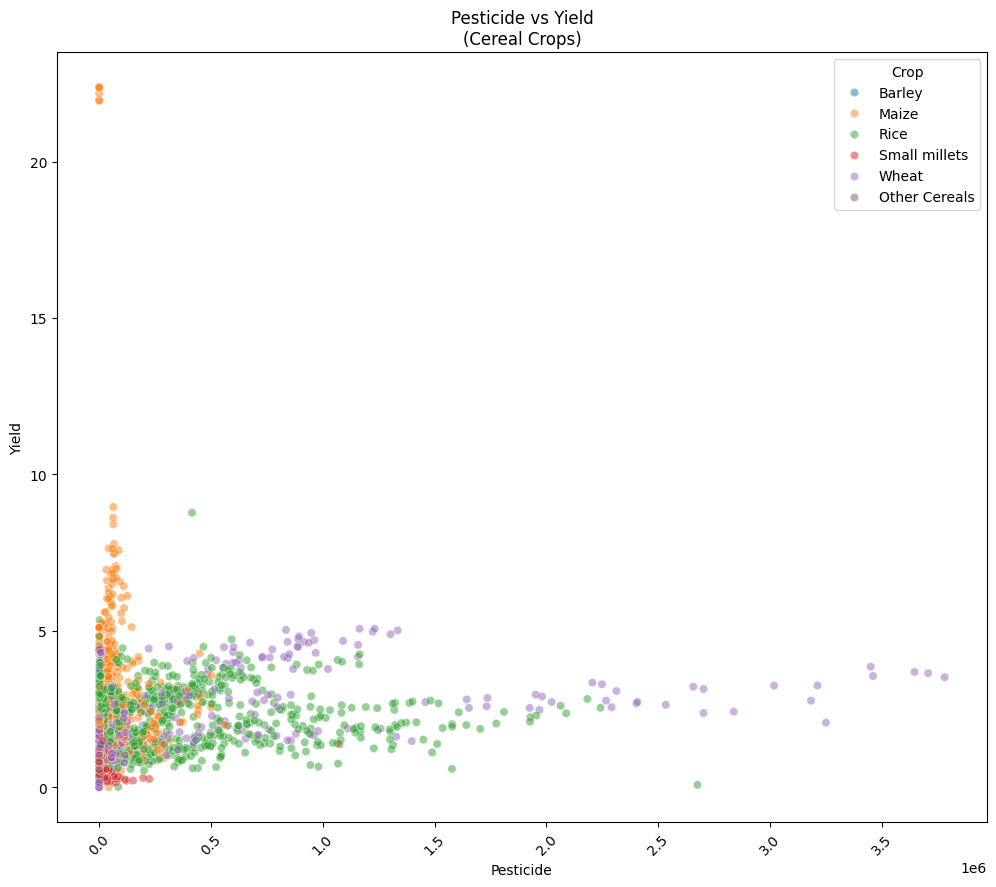

In [26]:
# Plotting pesticide vs Production without outliers (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Pesticide', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Pesticide vs Production\n(All Crops)')
plt.xlabel('Pesticide')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting pesticide vs yield without outliers (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Pesticide', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Pesticide vs Yield\n(All Crops)')
plt.xlabel('Pesticide')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

# Plotting pesticide vs Production without outliers (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Pesticide', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Pesticide vs Production\n(Cereal Crops)')
plt.xlabel('Pesticide')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting pesticide vs yield without outliers (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Pesticide', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Pesticide vs Yield\n(Cereal Crops)')
plt.xlabel('Pesticide')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()


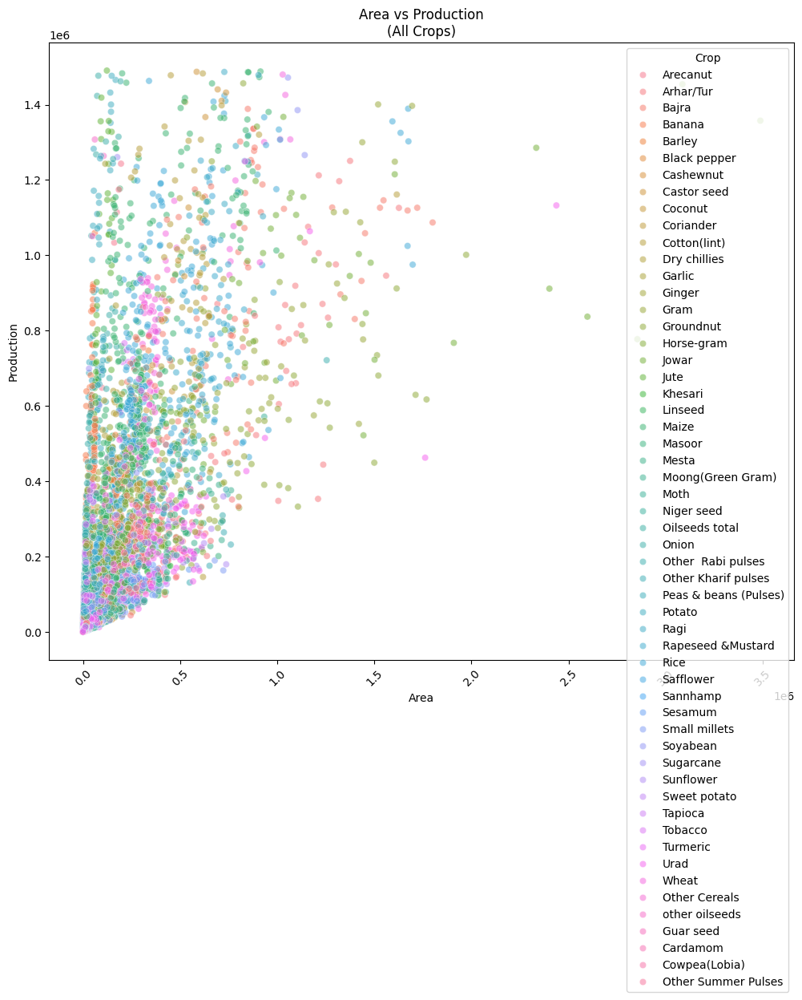

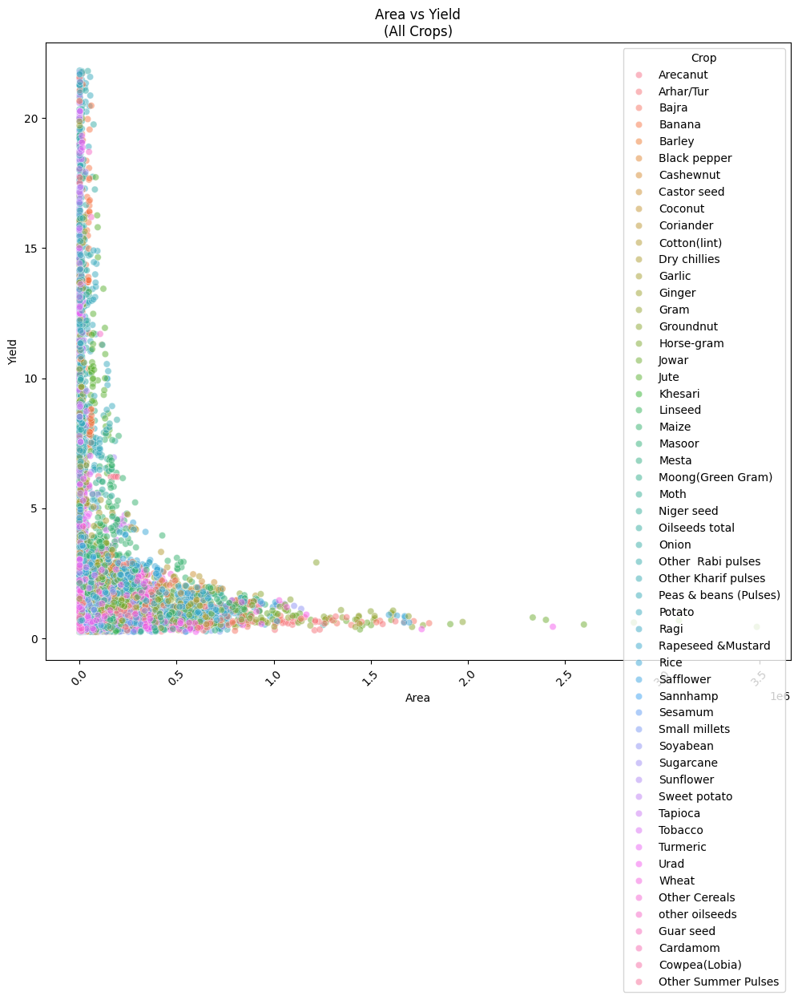

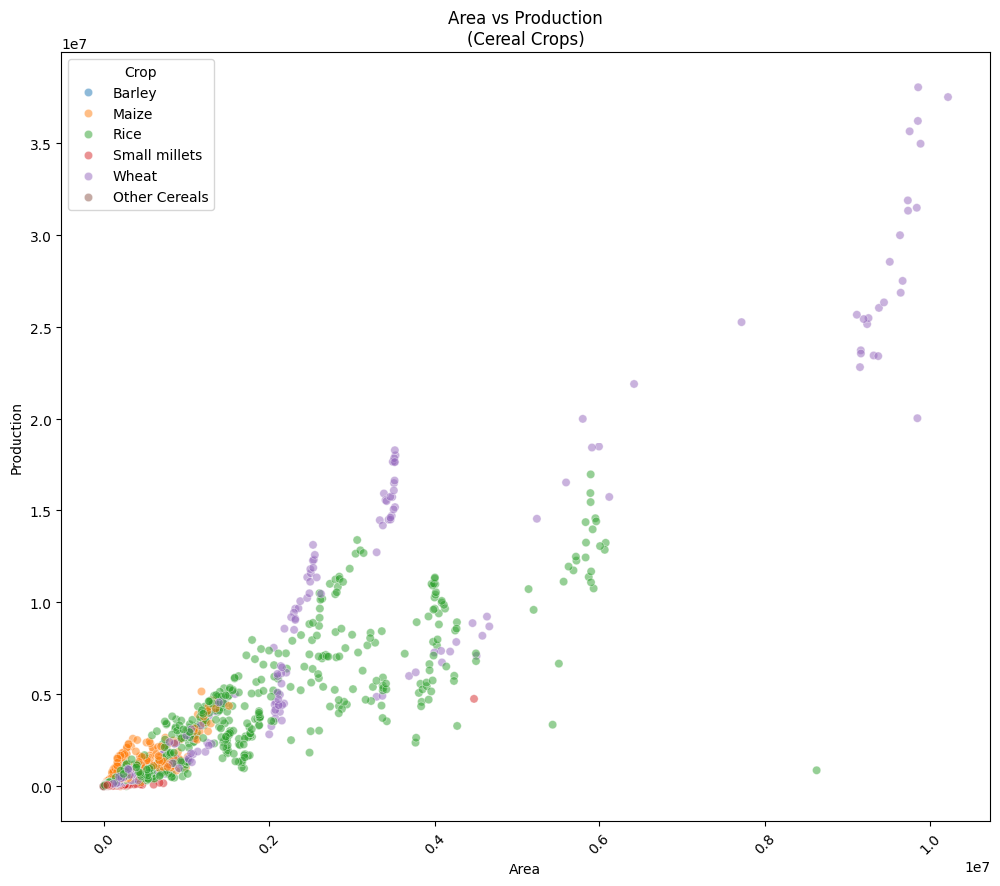

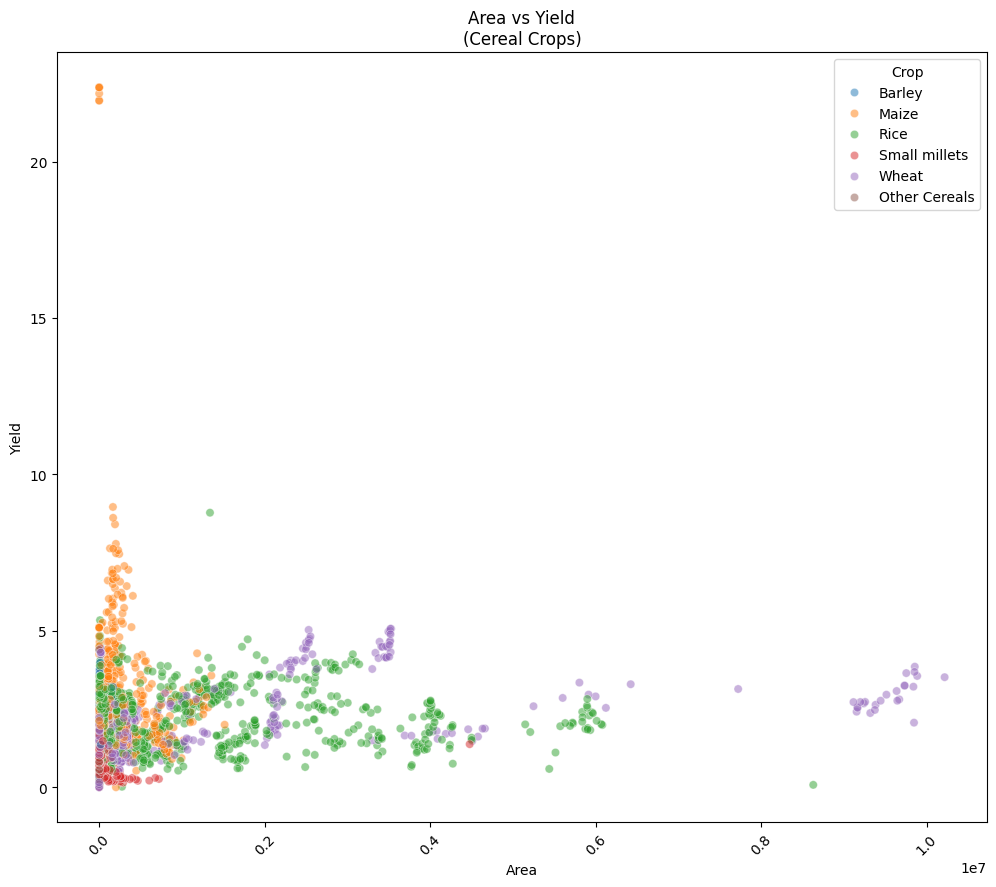

In [27]:
# Plotting Area vs Production without outliers (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Area', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Area vs Production\n(All Crops)')
plt.xlabel('Area')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting area vs Yield without outliers (All Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = crop_yield, x = 'Area', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Area vs Yield\n(All Crops)')
plt.xlabel('Area')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()

# Plotting Area vs Production without outliers (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Area', y = 'Production', hue = 'Crop', alpha = 0.5)
plt.title('Area vs Production\n(Cereal Crops)')
plt.xlabel('Area')
plt.ylabel('Production')
plt.xticks(rotation = 45)
plt.show()

# Plotting Area vs Yield without outliers (Cereal Crops)
plt.figure(figsize = (12, 10))
sns.scatterplot(data = cereal_crop_yield, x = 'Area', y = 'Yield', hue = 'Crop', alpha = 0.5)
plt.title('Area vs Yield\n(Cereal Crops)')
plt.xlabel('Area')
plt.ylabel('Yield')
plt.xticks(rotation = 45)
plt.show()


In [28]:
# getting corr values

corr_vars = crop_yield[crop_yield.columns[crop_yield.dtypes != object]]
corr_matrix = corr_vars.corr()
corr_matrix

,Crop_Year,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
Crop_Year,1.000000,-0.091147,-0.039472,-0.016869,-0.011147,-0.039764,0.037889
Area,-0.091147,1.000000,0.740843,-0.173134,0.974146,0.965252,-0.115104
Production,-0.039472,0.740843,1.000000,-0.154191,0.740409,0.718814,0.142580
Annual_Rainfall,-0.016869,-0.173134,-0.154191,1.000000,-0.168963,-0.165449,0.026853
Fertilizer,-0.011147,0.974146,0.740409,-0.168963,1.000000,0.956924,-0.111254
Pesticide,-0.039764,0.965252,0.718814,-0.165449,0.956924,1.000000,-0.109014
Yield,0.037889,-0.115104,0.142580,0.026853,-0.111254,-0.109014,1.000000


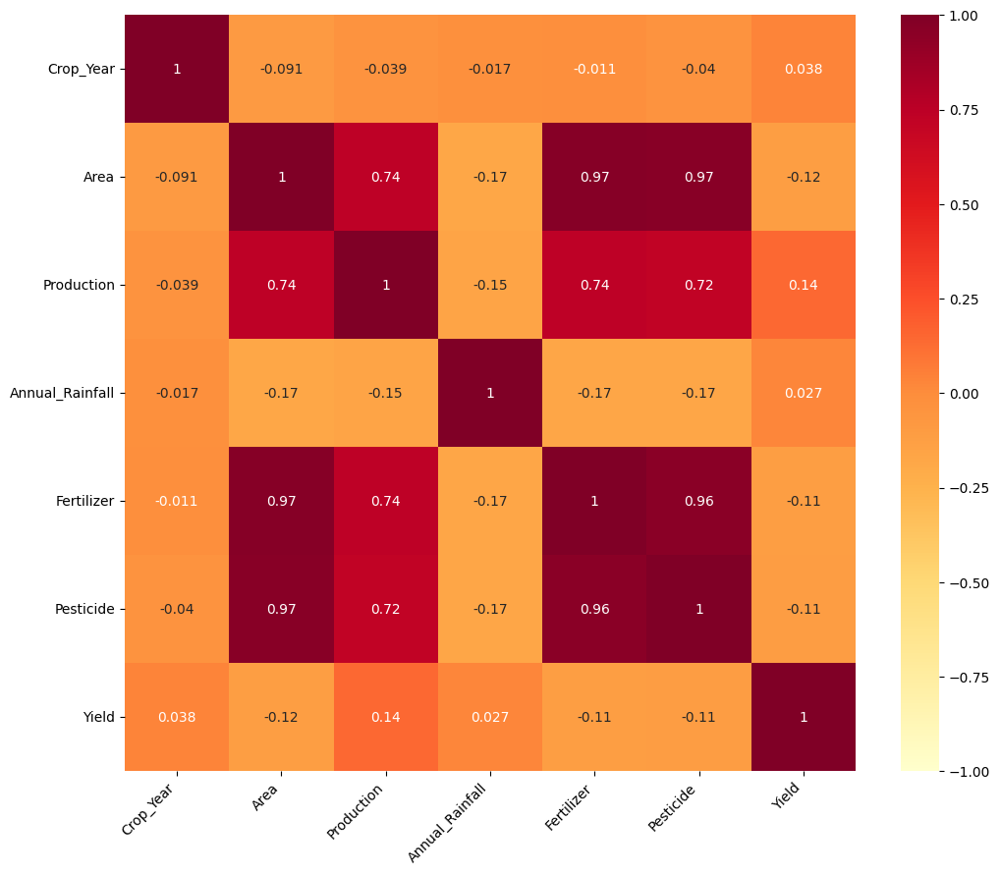

In [29]:
# corr heatmap
plt.figure(figsize = (12, 10))
heatmap = sns.heatmap(corr_matrix, annot=True, annot_kws={"size": 10}, cmap='YlOrRd', vmin=-1, vmax=1)
plt.xticks(rotation=45, ha='right')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()


## Since 'Production' has stronger correlations than 'Yield' we will cater our models towards predicting production.

In [30]:
crop_yield.columns

Index(['Crop', 'Crop_Year', 'Season', 'State', 'Area', 'Production',
       'Annual_Rainfall', 'Fertilizer', 'Pesticide', 'Yield'],
      dtype='object')

In [31]:
# Dropping 'Coconut' which only appears in the year 1997 so it can't be used for training AND testing
crop_yield.drop(index = 58, inplace = True)
crop_yield.reset_index(inplace = True, drop = True)
crop_yield.iloc[58]

Crop                 Dry chillies
Crop_Year                    1997
Season                       Rabi
State              Andhra Pradesh
Area                      54600.0
Production                 101900
Annual_Rainfall             927.5
Fertilizer              5196282.0
Pesticide                 16926.0
Yield                    1.770909
Name: 58, dtype: object

In [32]:
# Dropping 'Other Summer Pulses' from 'Crop' column to maintain train and test set consistency
print(crop_yield[crop_yield['Crop'] == 'Other Summer Pulses'])
crop_yield.drop(index = [12964, 13817, 13818, 13820, 13821, 14686, 14689, 15550, 15554], inplace = True)
crop_yield.reset_index(inplace = True, drop = True)
crop_yield[crop_yield['Crop'] == 'Other Summer Pulses']

                      Crop  Crop_Year  Season        State     Area  \
12964  Other Summer Pulses       2016  Summer  Maharashtra   2170.0   
13820  Other Summer Pulses       2017  Summer  Maharashtra   2164.0   
13821  Other Summer Pulses       2017  Summer   Puducherry     15.0   
14689  Other Summer Pulses       2018  Summer  Maharashtra   2030.0   
15554  Other Summer Pulses       2019  Summer  Maharashtra  12685.0   

       Production  Annual_Rainfall  Fertilizer  Pesticide     Yield  
12964        1443           1151.1   332552.50     759.50  0.688750  
13820         691           1129.5   340700.16     822.32  0.334667  
13821          42           1582.4     2361.60       5.70  2.800000  
14689         648           1387.4   329266.00     710.50  0.426364  
15554        5526           1555.8  2178775.60    4693.45  0.489474  


,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield


## Creating predictive crop model

In [33]:
# checking years

crop_yield['Crop_Year'].unique()

array([1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007,
       2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018,
       2019, 2020], dtype=int64)

In [34]:
# creating training set with years 1997-2015
crop_yield_train_years = crop_yield[crop_yield['Crop_Year'] <= 2015]
crop_yield_train_years.reset_index(inplace = True, drop = True)
crop_yield_train_years

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.4,7024878.38,22882.34,0.796087
1,Arecanut,1997,Whole Year,Kerala,76145.0,93995,3252.4,7246719.65,23604.95,1.147857
2,Arecanut,1997,Whole Year,Meghalaya,9569.0,12116,3818.2,910681.73,2966.39,1.245714
3,Arecanut,1997,Whole Year,Karnataka,93100.0,133342,1266.7,8860327.00,28861.00,1.293571
4,Arecanut,1997,Whole Year,West Bengal,8058.0,12423,1852.9,766879.86,2497.98,1.691765
...,...,...,...,...,...,...,...,...,...,...
12484,other oilseeds,2015,Rabi,Uttarakhand,627.0,315,1247.6,99009.57,206.91,0.568000
12485,other oilseeds,2015,Kharif,Nagaland,2370.0,1420,1308.3,374246.70,782.10,0.595556
12486,other oilseeds,2015,Summer,Maharashtra,307.0,340,875.7,48478.37,101.31,0.680000
12487,other oilseeds,2015,Rabi,Haryana,1000.0,1000,426.8,157910.00,330.00,1.000000


In [35]:
# creating testing set with years 2016-2020
crop_yield_test_years = crop_yield[crop_yield['Crop_Year'] >= 2016]
crop_yield_test_years.reset_index(inplace = True, drop = True)
crop_yield_test_years

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,2016,Rabi,Assam,66800.0,49687,2296.800000,10237100.00,23380.00,0.770370
1,Arecanut,2016,Whole Year,Kerala,97696.0,116839,2924.300000,14971912.00,34193.60,0.883571
2,Arecanut,2016,Rabi,Meghalaya,18190.0,23931,3837.100000,2787617.50,6366.50,1.291818
3,Arecanut,2016,Whole Year,Tamil Nadu,7078.0,12708,912.400000,1084703.50,2477.30,1.477273
4,Arecanut,2016,Whole Year,Goa,1810.0,3101,3266.900000,277382.50,633.50,1.725000
...,...,...,...,...,...,...,...,...,...,...
3454,Soyabean,2020,Kharif,Uttarakhand,7246.0,8800,1313.947826,1402898.06,2681.02,1.214167
3455,Turmeric,2020,Whole Year,Uttarakhand,1299.0,4186,1313.947826,251499.39,480.63,2.808333
3456,Urad,2020,Kharif,Uttarakhand,12398.0,13282,1313.947826,2400376.78,4587.26,1.120769
3457,Urad,2020,Summer,Uttarakhand,58.0,69,1313.947826,11229.38,21.46,1.193333


Mean Squared Error (Training): 963311480.377816
Mean Squared Error (Testing): 2602537468.017698
Root Mean Squared Error (Training): 31037.259550060407
Root Mean Squared Error (Testing): 51015.070989048894
Mean Absolute Error (Training): 13641.998529449793
Mean Absolute Error (Testing): 20202.152078800846
R² (Training): 0.9827719618231818
R² (Testing): 0.9507839467323754
Adjusted R² (Training): 0.9827581545395297
Adjusted R² (Testing): 0.950625759337381


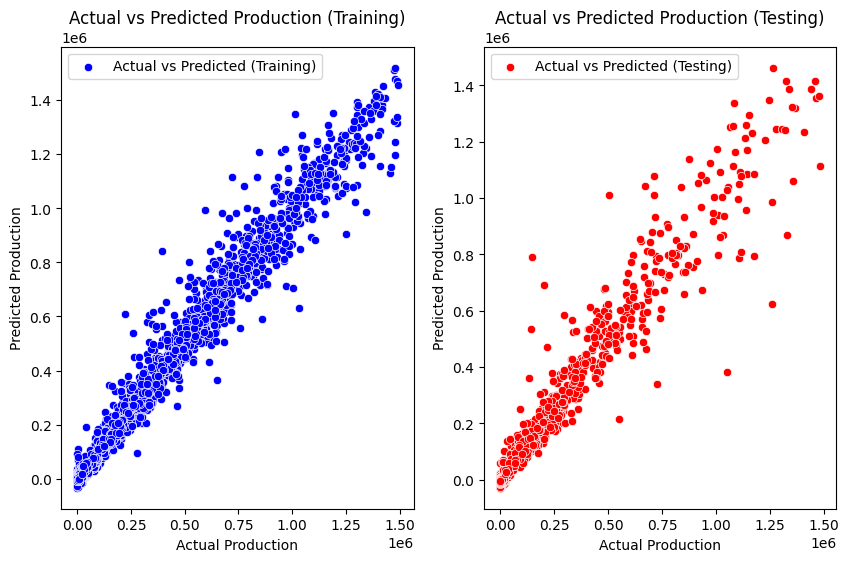

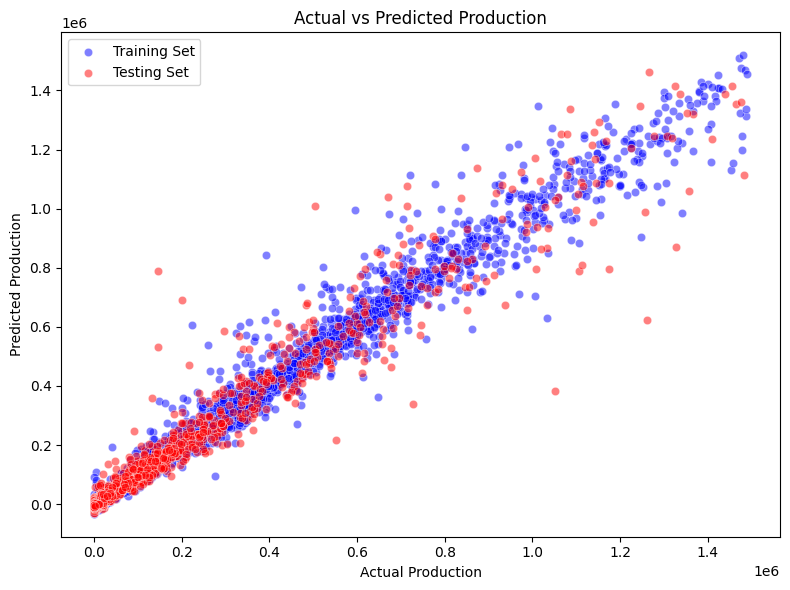

<Figure size 640x480 with 0 Axes>

In [36]:
# Creating model

# Separate features and target variable
X = crop_yield_train_years.drop(['Yield', 'Production'], axis=1)
y = crop_yield_train_years['Production']

# Define data preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), ['Crop', 'Season', 'State']),  # One-hot encode categorical features
        ('num', StandardScaler(), ['Area', 'Crop_Year', 'Fertilizer', 'Pesticide', 'Annual_Rainfall'])  # Standardize numerical features
    ],
    remainder='passthrough'  # Keep other columns unchanged
)

# Define neural network with L2 regularization
def create_neural_network_l2(num_hidden_layers=2, num_neurons=100, activation='relu', max_iter=200, alpha=0.0001):
    hidden_layer_sizes = tuple([num_neurons] * num_hidden_layers)  # Define the hidden layer sizes
    return MLPRegressor(hidden_layer_sizes=hidden_layer_sizes, activation=activation, max_iter=max_iter, alpha=alpha, random_state=42)

# Scale the target variable
crop_target_scaler = StandardScaler()

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the scaler on the training target variable
y_train_scaled = crop_target_scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten()
# Transform the test target variable
y_test_scaled = crop_target_scaler.transform(y_test.values.reshape(-1, 1)).flatten()

# Create a pipeline with the preprocessor and the neural network model with L2 regularization
crop_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  # Data preprocessing
    ('regressor', create_neural_network_l2())  # Neural network model with L2 regularization
])

# Fit the pipeline on the training data
crop_pipeline.fit(X_train, y_train_scaled)

# Predict on the training and testing data
y_train_pred_scaled = crop_pipeline.predict(X_train)
y_test_pred_scaled = crop_pipeline.predict(X_test)

# Inverse transform the predictions to get the original scale
y_train_pred = crop_target_scaler.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).flatten()
y_test_pred = crop_target_scaler.inverse_transform(y_test_pred_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_train = mean_squared_error(y_train, y_train_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)
mae_train = mean_absolute_error(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate Adjusted R²
def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_train = X_train.shape[0]
p = X_train.shape[1]
adjusted_r2_train = adjusted_r2(r2_train, n_train, p)

n_test = X_test.shape[0]
adjusted_r2_test = adjusted_r2(r2_test, n_test, p)

print("Mean Squared Error (Training):", mse_train)
print("Mean Squared Error (Testing):", mse_test)
print("Root Mean Squared Error (Training):", rmse_train)
print("Root Mean Squared Error (Testing):", rmse_test)
print("Mean Absolute Error (Training):", mae_train)
print("Mean Absolute Error (Testing):", mae_test)
print("R² (Training):", r2_train)
print("R² (Testing):", r2_test)
print("Adjusted R² (Training):", adjusted_r2_train)
print("Adjusted R² (Testing):", adjusted_r2_test)

# Plot the actual vs predicted yield for training and testing data
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(x=y_train, y=y_train_pred, color='blue', label='Actual vs Predicted (Training)')
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Actual vs Predicted Production (Training)')
plt.legend()

plt.subplot(1, 2, 2)
sns.scatterplot(x=y_test, y=y_test_pred, color='red', label='Actual vs Predicted (Testing)')
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Actual vs Predicted Production (Testing)')
plt.legend()

plt.figure(figsize=(8, 6))

# Plot actual vs predicted for training and testing set on same graph
sns.scatterplot(x=y_train, y=y_train_pred, color='blue', label='Training Set', alpha = 0.5)

sns.scatterplot(x=y_test, y=y_test_pred, color='red', label='Testing Set', alpha = 0.5)

plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Actual vs Predicted Production')
plt.legend()

plt.tight_layout()
plt.show()


plt.tight_layout()
plt.show()



In [37]:
# saving trained model

joblib.dump(crop_pipeline, 'crop_trained_model.pkl')

['crop_trained_model.pkl']

In [38]:
# loading trained model

joblib.dump(crop_target_scaler, 'crop_target_scaler.pkl')

['crop_target_scaler.pkl']

Mean Squared Error (New Data): 5762320570.327856
Root Mean Squared Error (New Data): 75909.9504039349
Mean Absolute Error (New Data): 30683.302706126025
R² (New Data): 0.8895570966705991
Adjusted R² (New Data): 0.8893009971846179


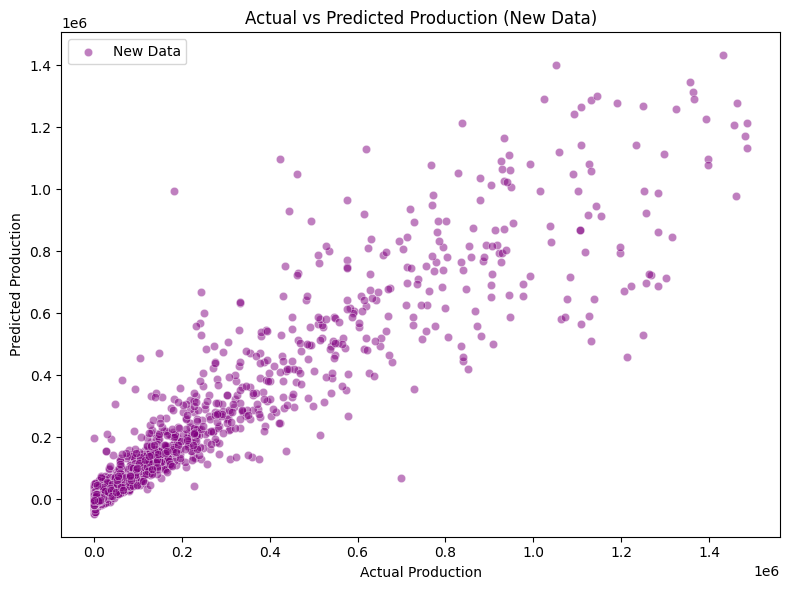

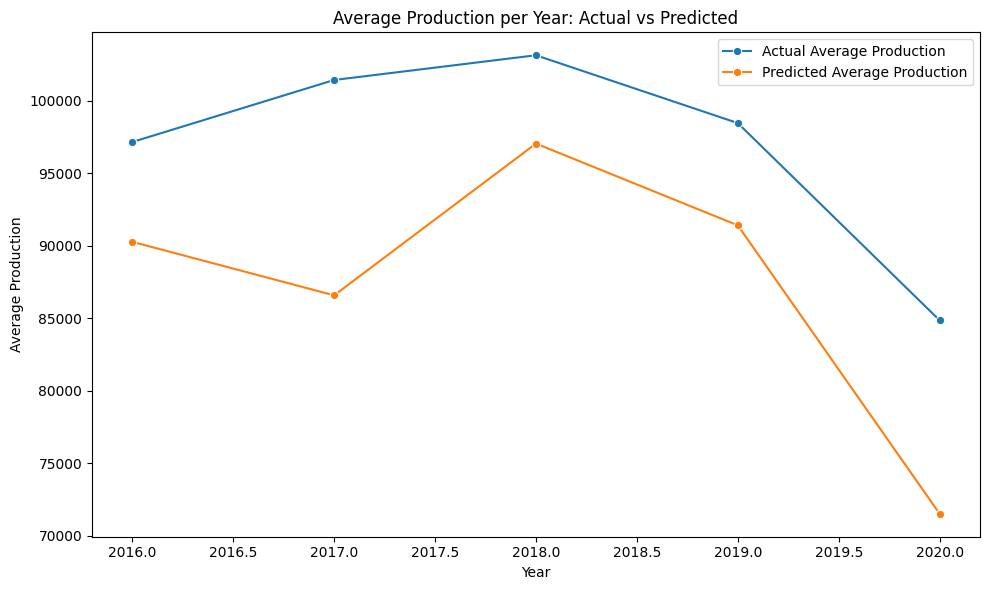

In [39]:
# Creating model

# Load the model and scaler
crop_trained_model = joblib.load('crop_trained_model.pkl')
crop_target_scaler = joblib.load('crop_target_scaler.pkl')

# Prepare new data
X_new = crop_yield_test_years.drop(['Yield', 'Production'], axis=1)
y_new_actual = crop_yield_test_years['Production']

# Predict on new data
new_predictions_scaled = crop_trained_model.predict(X_new)
new_predictions = crop_target_scaler.inverse_transform(new_predictions_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_new = mean_squared_error(y_new_actual, new_predictions)
rmse_new = np.sqrt(mse_new)
mae_new = mean_absolute_error(y_new_actual, new_predictions)
r2_new = r2_score(y_new_actual, new_predictions)

def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_new = X_new.shape[0]
p = X_new.shape[1]
adjusted_r2_new = adjusted_r2(r2_new, n_new, p)

print("Mean Squared Error (New Data):", mse_new)
print("Root Mean Squared Error (New Data):", rmse_new)
print("Mean Absolute Error (New Data):", mae_new)
print("R² (New Data):", r2_new)
print("Adjusted R² (New Data):", adjusted_r2_new)

# Plotting actual vs predicted values
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_new_actual, y=new_predictions, color='purple', label='New Data', alpha=0.5)
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Actual vs Predicted Production (New Data)')
plt.legend()

plt.tight_layout()
plt.show()

# Calculate average yield for each year for actual and predicted data
crop_yield_test_years['Predicted_Production'] = new_predictions

actual_avg_production_per_year = crop_yield_test_years.groupby('Crop_Year')['Production'].mean()
predicted_avg_production_per_year = crop_yield_test_years.groupby('Crop_Year')['Predicted_Production'].mean()

# Create a DataFrame to store the averages
avg_production_per_year = pd.DataFrame({
    'Actual_Avg_Production': actual_avg_production_per_year,
    'Predicted_Avg_Production': predicted_avg_production_per_year
}).reset_index()

# Plot the average yield for each year
plt.figure(figsize=(10, 6))
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=avg_production_per_year, marker='o', label='Actual Average Production')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=avg_production_per_year, marker='o', label='Predicted Average Production')

plt.xlabel('Year')
plt.ylabel('Average Production')
plt.title('Average Production per Year: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()


In [40]:
# checking df
crop_yield_train_years

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.4,7024878.38,22882.34,0.796087
1,Arecanut,1997,Whole Year,Kerala,76145.0,93995,3252.4,7246719.65,23604.95,1.147857
2,Arecanut,1997,Whole Year,Meghalaya,9569.0,12116,3818.2,910681.73,2966.39,1.245714
3,Arecanut,1997,Whole Year,Karnataka,93100.0,133342,1266.7,8860327.00,28861.00,1.293571
4,Arecanut,1997,Whole Year,West Bengal,8058.0,12423,1852.9,766879.86,2497.98,1.691765
...,...,...,...,...,...,...,...,...,...,...
12484,other oilseeds,2015,Rabi,Uttarakhand,627.0,315,1247.6,99009.57,206.91,0.568000
12485,other oilseeds,2015,Kharif,Nagaland,2370.0,1420,1308.3,374246.70,782.10,0.595556
12486,other oilseeds,2015,Summer,Maharashtra,307.0,340,875.7,48478.37,101.31,0.680000
12487,other oilseeds,2015,Rabi,Haryana,1000.0,1000,426.8,157910.00,330.00,1.000000


In [41]:
# checking crops
crop_yield_train_years['Crop'].unique()

array(['Arecanut', 'Arhar/Tur', 'Bajra', 'Banana', 'Barley',
       'Black pepper', 'Cashewnut', 'Castor seed', 'Coriander',
       'Cotton(lint)', 'Dry chillies', 'Garlic', 'Ginger', 'Gram',
       'Groundnut', 'Horse-gram', 'Jowar', 'Jute', 'Khesari', 'Linseed',
       'Maize', 'Masoor', 'Mesta', 'Moong(Green Gram)', 'Moth',
       'Niger seed', 'Oilseeds total', 'Onion', 'Other  Rabi pulses',
       'Other Kharif pulses', 'Peas & beans (Pulses)', 'Potato', 'Ragi',
       'Rapeseed &Mustard', 'Rice', 'Safflower', 'Sannhamp', 'Sesamum',
       'Small millets', 'Soyabean', 'Sugarcane', 'Sunflower',
       'Sweet potato', 'Tapioca', 'Tobacco', 'Turmeric', 'Urad', 'Wheat',
       'Other Cereals', 'other oilseeds', 'Guar seed', 'Cardamom',
       'Cowpea(Lobia)'], dtype=object)

# Due to the most consumed and grown crops being cereal crops, the remaining models will be focused on predicting prodution of  these. The crops will be divided into dry season cereal crop and wet season cereal crop groups.

In [42]:
# creating df with only "dry season" crops
dry_season_crops_train = crop_yield_train_years[(crop_yield_train_years['Crop'] == 'Barley') | (crop_yield_train_years['Crop'] == 'Wheat')]

#creating training set with only dry season crops
dry_season_crops_train

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
31,Barley,1997,Rabi,Bihar,42838.0,44140,1303.7,4076892.46,13279.78,1.040000
32,Barley,1997,Rabi,Sikkim,1310.0,1510,2804.1,124672.70,406.10,1.155000
33,Barley,1997,Rabi,Madhya Pradesh,91200.0,110500,1189.1,8679504.00,28272.00,1.347097
34,Barley,1997,Whole Year,West Bengal,6116.0,5034,1852.9,582059.72,1895.96,1.680000
35,Barley,1997,Rabi,Uttar Pradesh,337037.0,747044,473.9,32075811.29,104481.47,2.046329
...,...,...,...,...,...,...,...,...,...,...
12478,Wheat,2015,Rabi,West Bengal,339851.0,788503,1717.0,53665871.41,112150.83,2.191111
12479,Wheat,2015,Rabi,Tripura,182.0,407,2334.4,28739.62,60.06,2.221429
12480,Wheat,2015,Rabi,Manipur,2250.0,5620,1329.1,355297.50,742.50,2.503333
12481,Wheat,2015,Rabi,Telangana,4952.0,16902,747.9,781970.32,1634.16,2.947500


In [43]:
# creating df with only "wet season" crops
wet_season_crops_train = crop_yield_train_years[(crop_yield_train_years['Crop'] == 'Maize') | (crop_yield_train_years['Crop'] == 'Rice') | (crop_yield_train_years['Crop'] == 'Small millets') | (crop_yield_train_years['Crop'] == 'Other Cereals')]

#creating training set with only wet season crops
wet_season_crops_train

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
127,Maize,1997,Kharif,Assam,19216.0,14721,2051.4,1828786.72,5956.96,0.615652
128,Maize,1997,Whole Year,Sikkim,9580.0,7605,2804.1,911728.60,2969.80,0.787500
129,Maize,1997,Autumn,Odisha,51349.0,63331,1496.6,4886884.33,15918.19,0.812000
130,Maize,1997,Summer,Odisha,1164.0,978,1496.6,110777.88,360.84,0.945714
131,Maize,1997,Winter,Odisha,144.0,136,1496.6,13704.48,44.64,0.992500
...,...,...,...,...,...,...,...,...,...,...
12332,Small millets,2015,Kharif,Nagaland,8740.0,9810,1308.3,1380133.40,2884.20,1.115556
12333,Small millets,2015,Kharif,Tamil Nadu,22406.0,31304,1201.9,3538131.46,7393.98,1.206957
12334,Small millets,2015,Rabi,Gujarat,14582.0,18735,584.3,2302643.62,4812.06,1.245000
12335,Small millets,2015,Kharif,Uttarakhand,56570.0,72632,1247.6,8932968.70,18668.10,1.283636


In [44]:
# creating 'dry season' test 
dry_season_crops_test = crop_yield_test_years[(crop_yield_test_years['Crop'] == 'Barley') | (crop_yield_test_years['Crop'] == 'Wheat')]

#creating testing set with only dry season crops
dry_season_crops_test

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield,Predicted_Production
60,Barley,2016,Kharif,Jammu and Kashmir,189.0,67,902.800000,28964.25,66.15,0.350000,2881.176603
61,Barley,2016,Rabi,Jammu and Kashmir,6571.0,4205,902.800000,1007005.75,2299.85,0.778750,3337.228521
62,Barley,2016,Rabi,Himachal Pradesh,19943.0,18125,1373.900000,3056264.75,6980.05,0.925455,19222.445800
63,Barley,2016,Rabi,Chhattisgarh,2065.0,1879,1298.900000,316461.25,722.75,0.964286,-7175.849410
64,Barley,2016,Rabi,Sikkim,453.0,481,2971.600000,69422.25,158.55,1.010000,-4423.646183
...,...,...,...,...,...,...,...,...,...,...,...
3421,Wheat,2019,Rabi,Uttarakhand,303283.0,887440,1378.900000,52091888.08,112214.71,2.376923,779946.541763
3422,Wheat,2019,Rabi,West Bengal,188308.0,509970,1733.400000,32343782.08,69673.96,2.647619,585796.482010
3423,Wheat,2019,Rabi,Delhi,19228.0,82905,546.900000,3302601.28,7114.36,4.310000,75792.369062
3434,Barley,2020,Rabi,Uttarakhand,19280.0,24479,1313.947826,3732800.80,7133.60,1.366923,26063.190235


In [45]:
# creating 'wet season' test 
wet_season_crops_test = crop_yield_test_years[(crop_yield_test_years['Crop'] == 'Maize') | (crop_yield_test_years['Crop'] == 'Rice') | (crop_yield_test_years['Crop'] == 'Small millets') | (crop_yield_test_years['Crop'] == 'Other Cereals')]

#creating testing set with only wet season crops
wet_season_crops_test

,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield,Predicted_Production
300,Maize,2016,Kharif,Tripura,12196.0,16608,2475.300000,1869037.00,4268.60,1.383750,20999.246801
301,Maize,2016,Winter,Odisha,1344.0,1736,1460.500000,205968.00,470.40,1.541818,-15676.314490
302,Maize,2016,Rabi,Tripura,2500.0,3887,2475.300000,383125.00,875.00,1.560000,6507.642793
303,Maize,2016,Kharif,Uttarakhand,21692.0,36649,1580.900000,3324299.00,7592.20,1.570000,23138.616810
304,Maize,2016,Kharif,Arunachal Pradesh,50300.0,75450,2933.700000,7708475.00,17605.00,1.584000,67369.249316
...,...,...,...,...,...,...,...,...,...,...,...
3443,Other Cereals,2020,Kharif,Uttarakhand,623.0,350,1313.947826,120619.03,230.51,0.558571,-18969.459548
3444,Other Cereals,2020,Rabi,Uttarakhand,411.0,333,1313.947826,79573.71,152.07,0.808000,-4729.969216
3451,Rice,2020,Kharif,Uttarakhand,241936.0,669372,1313.947826,46841228.96,89516.32,2.093077,676582.422463
3452,Rice,2020,Summer,Uttarakhand,15315.0,55057,1313.947826,2965137.15,5666.55,3.563333,75612.986509


## Modeling Dry Season Cereal Crops

Mean Squared Error (Training): 1034000369.2136115
Mean Squared Error (Testing): 3471787616.8901844
Root Mean Squared Error (Training): 32155.876122625108
Root Mean Squared Error (Testing): 58921.87723494716
Mean Absolute Error (Training): 13873.118921426581
Mean Absolute Error (Testing): 25734.87545135627
R² (Training): 0.9870642935900643
R² (Testing): 0.9606279919680677
Adjusted R² (Training): 0.986821938434843
Adjusted R² (Testing): 0.9574782313255131


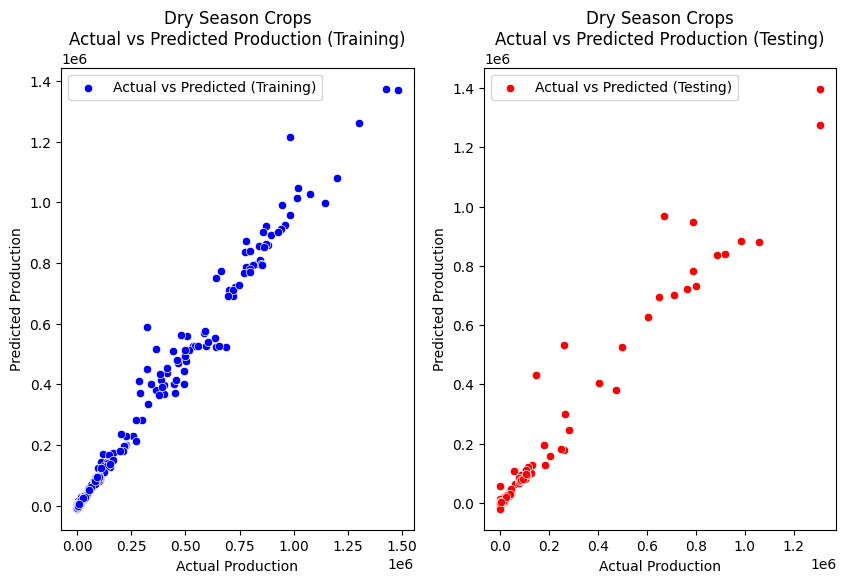

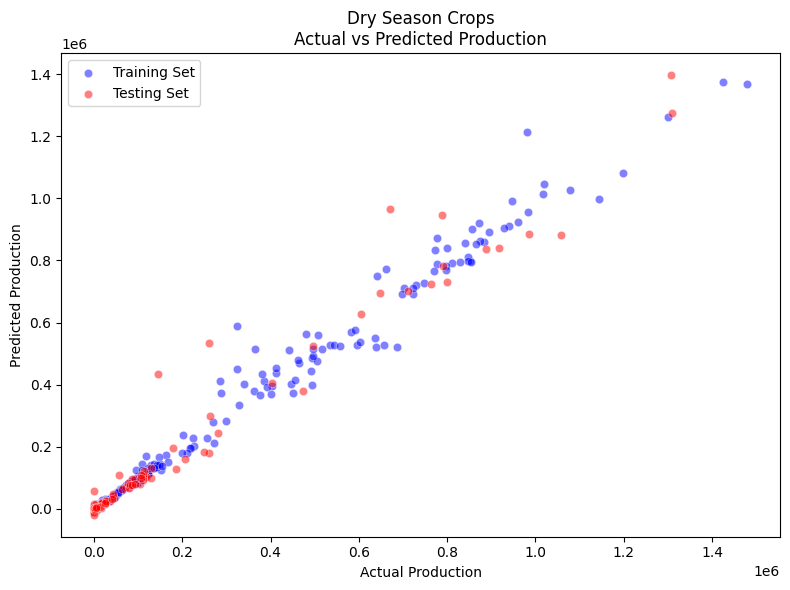

<Figure size 640x480 with 0 Axes>

In [46]:
# create model for dry season

'''
DRY SEASON CROPS
'''

# Separate features and target variable
X = dry_season_crops_train.drop(['Yield', 'Production'], axis=1)
y = dry_season_crops_train['Production']

# Define data preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown = 'ignore'), ['Crop', 'Season', 'State']),  # One-hot encode categorical features
        ('num', StandardScaler(), ['Area', 'Crop_Year', 'Fertilizer', 'Pesticide', 'Annual_Rainfall'])  # Standardize numerical features
    ],
    remainder='passthrough'  # Keep other columns unchanged
)

# Define neural network with L2 regularization
def create_neural_network_l2(num_hidden_layers=2, num_neurons=100, activation='relu', max_iter=200, alpha=0.0001):
    hidden_layer_sizes = tuple([num_neurons] * num_hidden_layers)  # Define the hidden layer sizes
    return MLPRegressor(hidden_layer_sizes=hidden_layer_sizes, activation=activation, max_iter=max_iter, alpha=alpha, random_state=42)

# Scale the target variable
dry_crop_target_scaler = StandardScaler()

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the scaler on the training target variable
y_train_scaled = dry_crop_target_scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten()
# Transform the test target variable
y_test_scaled = dry_crop_target_scaler.transform(y_test.values.reshape(-1, 1)).flatten()

# Create a pipeline with the preprocessor and the neural network model with L2 regularization
dry_crop_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  # Data preprocessing
    ('regressor', create_neural_network_l2(num_hidden_layers=2, max_iter=200, alpha=0.0001))  # Neural network model with L2 regularization
])

# Fit the pipeline on the training data
dry_crop_pipeline.fit(X_train, y_train_scaled)

# Predict on the training and testing data
y_train_pred_scaled = dry_crop_pipeline.predict(X_train)
y_test_pred_scaled = dry_crop_pipeline.predict(X_test)

# Inverse transform the predictions to get the original scale
y_train_pred = dry_crop_target_scaler.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).flatten()
y_test_pred = dry_crop_target_scaler.inverse_transform(y_test_pred_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_train = mean_squared_error(y_train, y_train_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)
mae_train = mean_absolute_error(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate Adjusted R²
def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_train = X_train.shape[0]
p = X_train.shape[1]
adjusted_r2_train = adjusted_r2(r2_train, n_train, p)

n_test = X_test.shape[0]
adjusted_r2_test = adjusted_r2(r2_test, n_test, p)

print("Mean Squared Error (Training):", mse_train)
print("Mean Squared Error (Testing):", mse_test)
print("Root Mean Squared Error (Training):", rmse_train)
print("Root Mean Squared Error (Testing):", rmse_test)
print("Mean Absolute Error (Training):", mae_train)
print("Mean Absolute Error (Testing):", mae_test)
print("R² (Training):", r2_train)
print("R² (Testing):", r2_test)
print("Adjusted R² (Training):", adjusted_r2_train)
print("Adjusted R² (Testing):", adjusted_r2_test)

# Plot the actual vs predicted yield for training and testing data
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(x=y_train, y=y_train_pred, color='blue', label='Actual vs Predicted (Training)')
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Dry Season Crops\nActual vs Predicted Production (Training)')
plt.legend()

plt.subplot(1, 2, 2)
sns.scatterplot(x=y_test, y=y_test_pred, color='red', label='Actual vs Predicted (Testing)')
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Dry Season Crops\nActual vs Predicted Production (Testing)')
plt.legend()

plt.figure(figsize=(8, 6))

# Plot actual vs predicted for training and testing set on same graph
sns.scatterplot(x=y_train, y=y_train_pred, color='blue', label='Training Set', alpha = 0.5)

sns.scatterplot(x=y_test, y=y_test_pred, color='red', label='Testing Set', alpha = 0.5)

plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Dry Season Crops\nActual vs Predicted Production')
plt.legend()

plt.tight_layout()
plt.show()


plt.tight_layout()
plt.show()


In [47]:
# save trained model

joblib.dump(dry_crop_pipeline, 'dry_trained_model.pkl')

['dry_trained_model.pkl']

In [48]:
# load trained model

joblib.dump(dry_crop_target_scaler, 'dry_target_scaler.pkl')

['dry_target_scaler.pkl']

Mean Squared Error (New Data): 2833179426.03889
Root Mean Squared Error (New Data): 53227.61901530905
Mean Absolute Error (New Data): 27619.223257812147
R² (New Data): 0.9589515771313141
Adjusted R² (New Data): 0.955766785701847


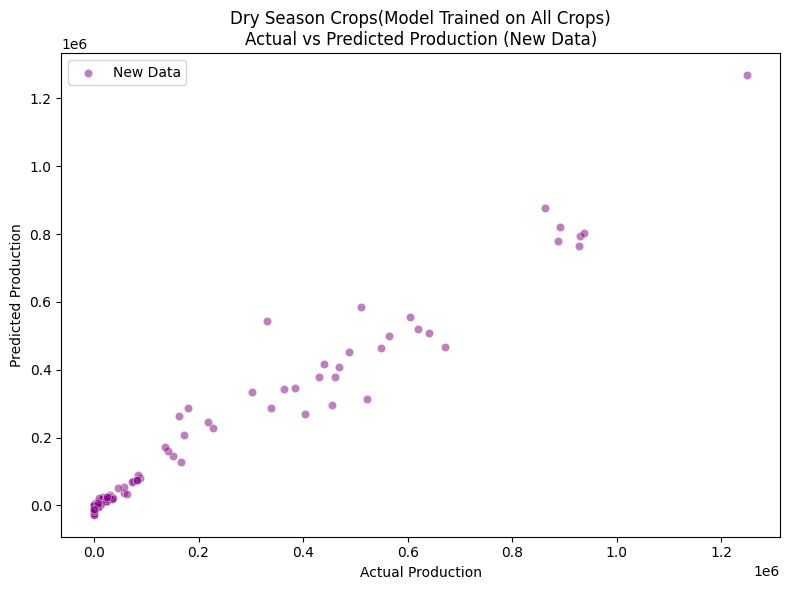

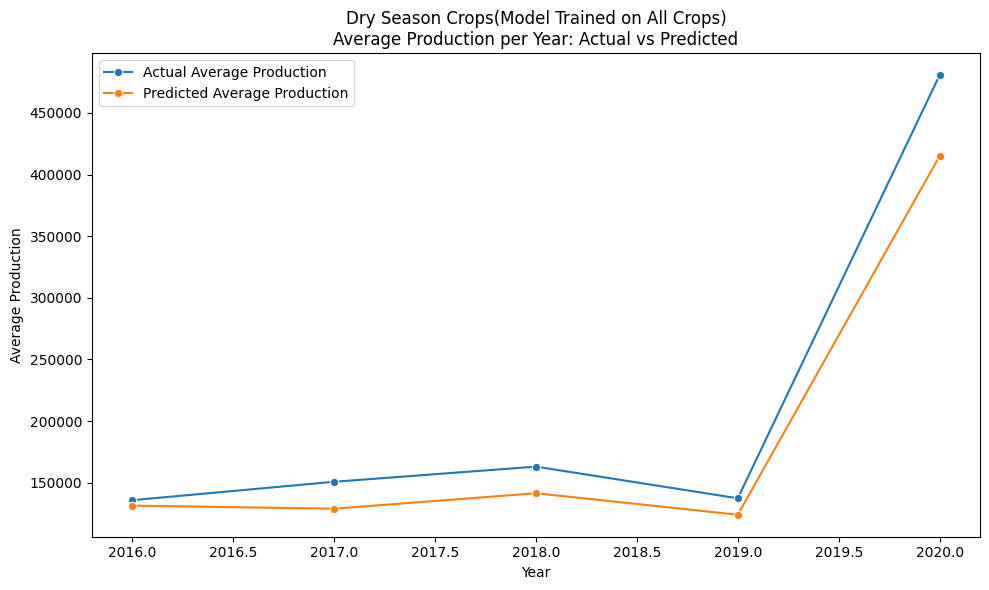

Mean Squared Error (New Data): 3049972883.9897575
Root Mean Squared Error (New Data): 55226.559588568954
Mean Absolute Error (New Data): 32337.242728230653
R² (New Data): 0.9558105725569679
Adjusted R² (New Data): 0.9523820824967326


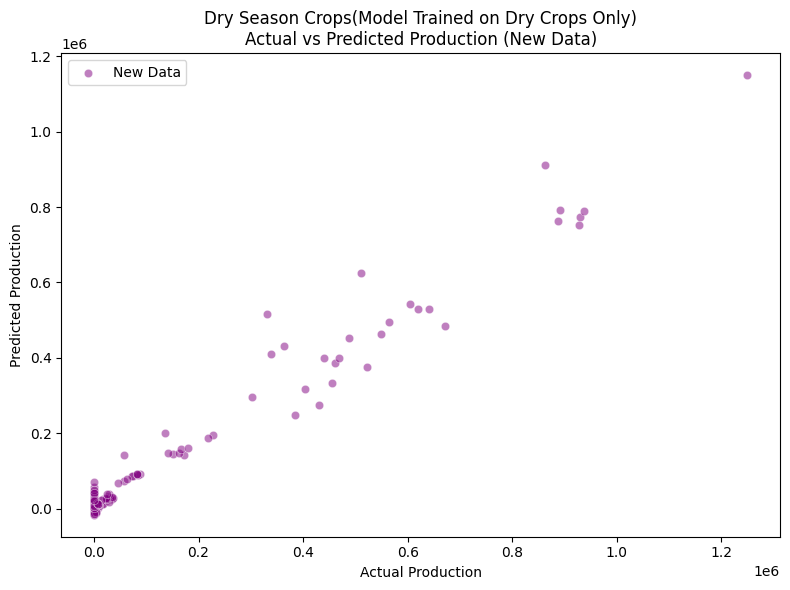

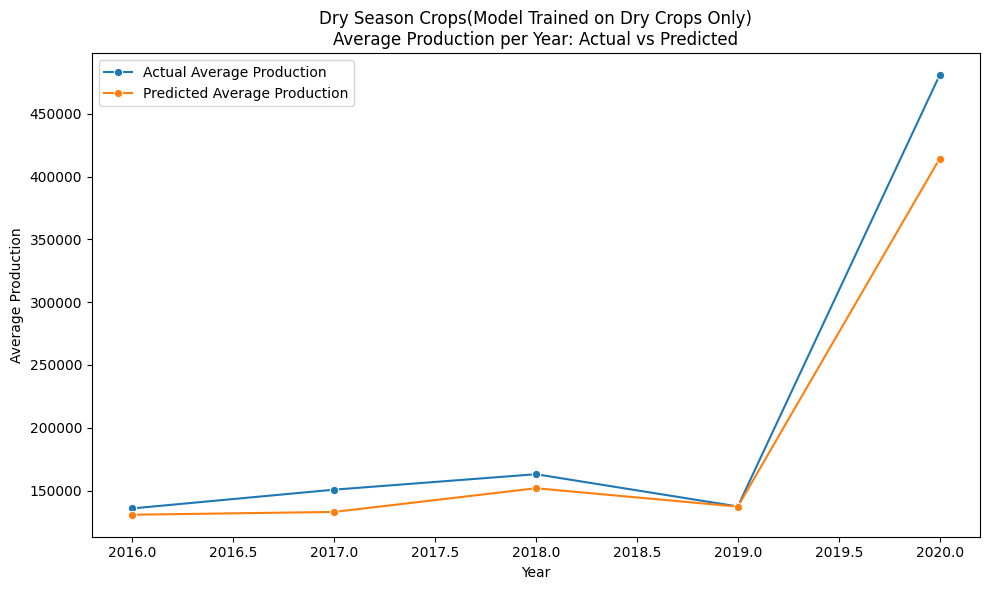

In [49]:
# Load the model and scaler
dry_trained_model = joblib.load('dry_trained_model.pkl')
dry_target_scaler = joblib.load('dry_target_scaler.pkl')

# Prepare new data
X_new = dry_season_crops_test.drop(['Yield', 'Production'], axis=1)
y_new_actual = dry_season_crops_test['Production']

# Predict on new data
new_predictions_scaled = crop_trained_model.predict(X_new)
new_predictions = crop_target_scaler.inverse_transform(new_predictions_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_new = mean_squared_error(y_new_actual, new_predictions)
rmse_new = np.sqrt(mse_new)
mae_new = mean_absolute_error(y_new_actual, new_predictions)
r2_new = r2_score(y_new_actual, new_predictions)

def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_new = X_new.shape[0]
p = X_new.shape[1]
adjusted_r2_new = adjusted_r2(r2_new, n_new, p)

print("Mean Squared Error (New Data):", mse_new)
print("Root Mean Squared Error (New Data):", rmse_new)
print("Mean Absolute Error (New Data):", mae_new)
print("R² (New Data):", r2_new)
print("Adjusted R² (New Data):", adjusted_r2_new)

# Plot the actual vs predicted values
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_new_actual, y=new_predictions, color='purple', label='New Data', alpha=0.5)
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Dry Season Crops(Model Trained on All Crops)\nActual vs Predicted Production (New Data)')
plt.legend()

plt.tight_layout()
plt.show()

# Calculate average yield for each year for actual and predicted data
dry_season_crops_test['Predicted_Production'] = new_predictions

actual_avg_production_per_year = dry_season_crops_test.groupby('Crop_Year')['Production'].mean()
predicted_avg_production_per_year = dry_season_crops_test.groupby('Crop_Year')['Predicted_Production'].mean()

# Create a DataFrame to store the averages
avg_production_per_year = pd.DataFrame({
    'Actual_Avg_Production': actual_avg_production_per_year,
    'Predicted_Avg_Production': predicted_avg_production_per_year
}).reset_index()

# Plot the average yield for each year
plt.figure(figsize=(10, 6))
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=avg_production_per_year, marker='o', label='Actual Average Production')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=avg_production_per_year, marker='o', label='Predicted Average Production')

plt.xlabel('Year')
plt.ylabel('Average Production')
plt.title('Dry Season Crops(Model Trained on All Crops)\nAverage Production per Year: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()

''''''''''''''''''''''''''
# Load the model and scaler
dry_trained_model = joblib.load('dry_trained_model.pkl')
dry_target_scaler = joblib.load('dry_target_scaler.pkl')

# Prepare new data
X_new = dry_season_crops_test.drop(['Yield', 'Production'], axis=1)
y_new_actual = dry_season_crops_test['Production']

# Predict on new data
new_predictions_scaled = dry_trained_model.predict(X_new)
new_predictions = dry_target_scaler.inverse_transform(new_predictions_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_new = mean_squared_error(y_new_actual, new_predictions)
rmse_new = np.sqrt(mse_new)
mae_new = mean_absolute_error(y_new_actual, new_predictions)
r2_new = r2_score(y_new_actual, new_predictions)

def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_new = X_new.shape[0]
p = X_new.shape[1]
adjusted_r2_new = adjusted_r2(r2_new, n_new, p)

print("Mean Squared Error (New Data):", mse_new)
print("Root Mean Squared Error (New Data):", rmse_new)
print("Mean Absolute Error (New Data):", mae_new)
print("R² (New Data):", r2_new)
print("Adjusted R² (New Data):", adjusted_r2_new)

# Plot the actual vs predicted values
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_new_actual, y=new_predictions, color='purple', label='New Data', alpha=0.5)
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Dry Season Crops(Model Trained on Dry Crops Only)\nActual vs Predicted Production (New Data)')
plt.legend()

plt.tight_layout()
plt.show()

# Calculate average yield for each year for actual and predicted data
dry_season_crops_test['Predicted_Production'] = new_predictions

actual_avg_production_per_year = dry_season_crops_test.groupby('Crop_Year')['Production'].mean()
predicted_avg_production_per_year = dry_season_crops_test.groupby('Crop_Year')['Predicted_Production'].mean()

# Create a DataFrame to store the averages
avg_production_per_year = pd.DataFrame({
    'Actual_Avg_Production': actual_avg_production_per_year,
    'Predicted_Avg_Production': predicted_avg_production_per_year
}).reset_index()

# Plot the average yield for each year
plt.figure(figsize=(10, 6))
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=avg_production_per_year, marker='o', label='Actual Average Production')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=avg_production_per_year, marker='o', label='Predicted Average Production')

plt.xlabel('Year')
plt.ylabel('Average Production')
plt.title('Dry Season Crops(Model Trained on Dry Crops Only)\nAverage Production per Year: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()

## Modeling Wet Season Cereal Crops

Mean Squared Error (Training): 1393960234.1531157
Mean Squared Error (Testing): 5620093488.867898
Root Mean Squared Error (Training): 37335.7768655363
Root Mean Squared Error (Testing): 74967.2827896803
Mean Absolute Error (Training): 16772.619095569375
Mean Absolute Error (Testing): 34120.826979637444
R² (Training): 0.9871462292458981
R² (Testing): 0.9447125431416981
Adjusted R² (Training): 0.9870745705936105
Adjusted R² (Testing): 0.9434560100312821


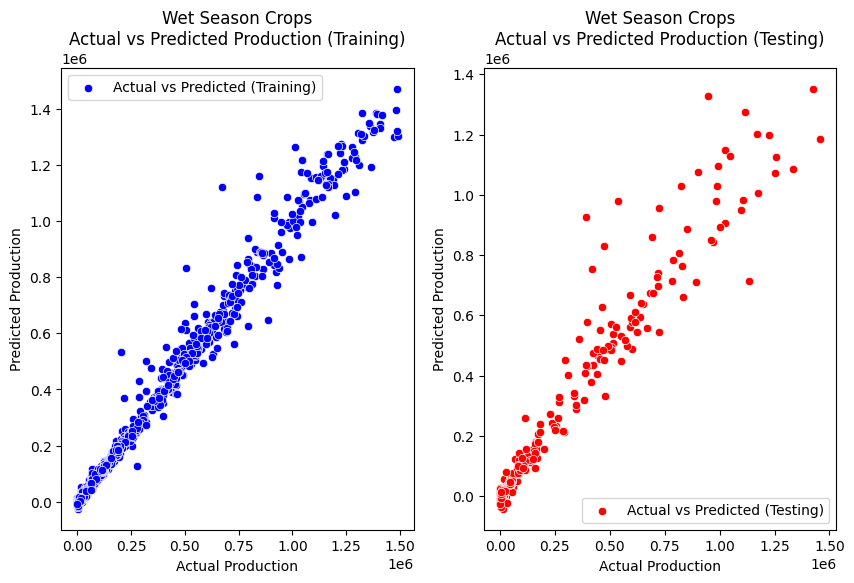

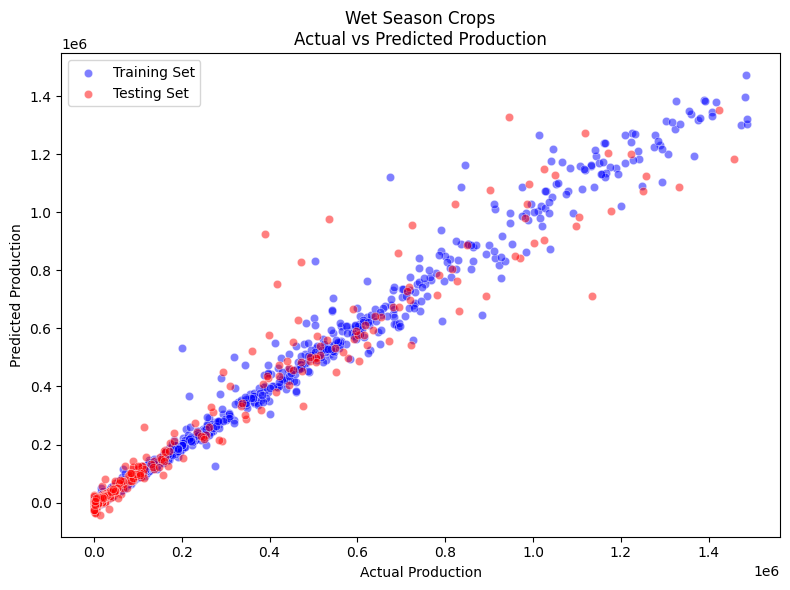

<Figure size 640x480 with 0 Axes>

In [50]:
# create a model for the wet season crops
'''
WET SEASON CROPS
'''

# Separate features and target variable
X = wet_season_crops_train.drop(['Yield', 'Production'], axis=1)
y = wet_season_crops_train['Production']

# Define data preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown = 'ignore'), ['Crop', 'Season', 'State']),  # One-hot encode categorical features
        ('num', StandardScaler(), ['Area', 'Crop_Year', 'Fertilizer', 'Pesticide', 'Annual_Rainfall'])  # Standardize numerical features
    ],
    remainder='passthrough'  # Keep other columns unchanged
)

# Define neural network with L2 regularization
def create_neural_network_l2(num_hidden_layers=2, num_neurons=100, activation='relu', max_iter=200, alpha=0.0001):
    hidden_layer_sizes = tuple([num_neurons] * num_hidden_layers)  # Define the hidden layer sizes
    return MLPRegressor(hidden_layer_sizes=hidden_layer_sizes, activation=activation, max_iter=max_iter, alpha=alpha, random_state=42)

# Scale the target variable
wet_crop_target_scaler = StandardScaler()

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the scaler on the training target variable
y_train_scaled = wet_crop_target_scaler.fit_transform(y_train.values.reshape(-1, 1)).flatten()
# Transform the test target variable
y_test_scaled = wet_crop_target_scaler.transform(y_test.values.reshape(-1, 1)).flatten()

# Create a pipeline with the preprocessor and the neural network model with L2 regularization
wet_crop_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),  # Data preprocessing
    ('regressor', create_neural_network_l2(num_hidden_layers=2, max_iter=200, alpha=0.0001))  # Neural network model with L2 regularization
])

# Fit the pipeline on the training data
wet_crop_pipeline.fit(X_train, y_train_scaled)

# Predict on the training and testing data
y_train_pred_scaled = wet_crop_pipeline.predict(X_train)
y_test_pred_scaled = wet_crop_pipeline.predict(X_test)

# Inverse transform the predictions to get the original scale
y_train_pred = wet_crop_target_scaler.inverse_transform(y_train_pred_scaled.reshape(-1, 1)).flatten()
y_test_pred = wet_crop_target_scaler.inverse_transform(y_test_pred_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_train = mean_squared_error(y_train, y_train_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)
mae_train = mean_absolute_error(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate Adjusted R²
def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_train = X_train.shape[0]
p = X_train.shape[1]
adjusted_r2_train = adjusted_r2(r2_train, n_train, p)

n_test = X_test.shape[0]
adjusted_r2_test = adjusted_r2(r2_test, n_test, p)

print("Mean Squared Error (Training):", mse_train)
print("Mean Squared Error (Testing):", mse_test)
print("Root Mean Squared Error (Training):", rmse_train)
print("Root Mean Squared Error (Testing):", rmse_test)
print("Mean Absolute Error (Training):", mae_train)
print("Mean Absolute Error (Testing):", mae_test)
print("R² (Training):", r2_train)
print("R² (Testing):", r2_test)
print("Adjusted R² (Training):", adjusted_r2_train)
print("Adjusted R² (Testing):", adjusted_r2_test)

# Plot the actual vs predicted yield for training and testing data
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
sns.scatterplot(x=y_train, y=y_train_pred, color='blue', label='Actual vs Predicted (Training)')
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Wet Season Crops\nActual vs Predicted Production (Training)')
plt.legend()

plt.subplot(1, 2, 2)
sns.scatterplot(x=y_test, y=y_test_pred, color='red', label='Actual vs Predicted (Testing)')
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Wet Season Crops\nActual vs Predicted Production (Testing)')
plt.legend()

plt.figure(figsize=(8, 6))

# Plot actual vs predicted for training and testing set on same graph
sns.scatterplot(x=y_train, y=y_train_pred, color='blue', label='Training Set', alpha = 0.5)

sns.scatterplot(x=y_test, y=y_test_pred, color='red', label='Testing Set', alpha = 0.5)

plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Wet Season Crops\nActual vs Predicted Production')
plt.legend()

plt.tight_layout()
plt.show()


plt.tight_layout()
plt.show()


In [51]:
# save trained model
joblib.dump(wet_crop_pipeline, 'wet_trained_model.pkl')

['wet_trained_model.pkl']

In [52]:
# load trained model
joblib.dump(wet_crop_target_scaler, 'wet_target_scaler.pkl')

['wet_target_scaler.pkl']

Mean Squared Error (New Data): 8197177522.917584
Root Mean Squared Error (New Data): 90538.26551750141
Mean Absolute Error (New Data): 43511.30776725492
R² (New Data): 0.9206396273981258
Adjusted R² (New Data): 0.9191760139689928


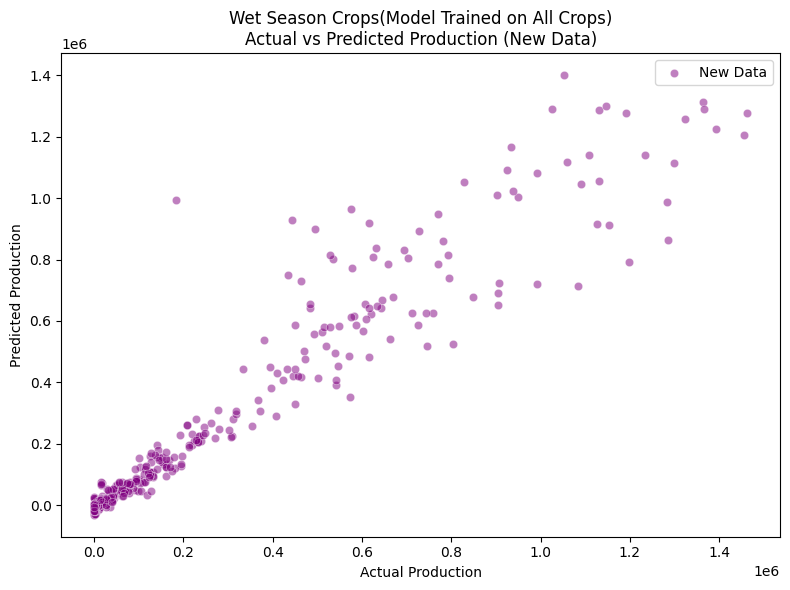

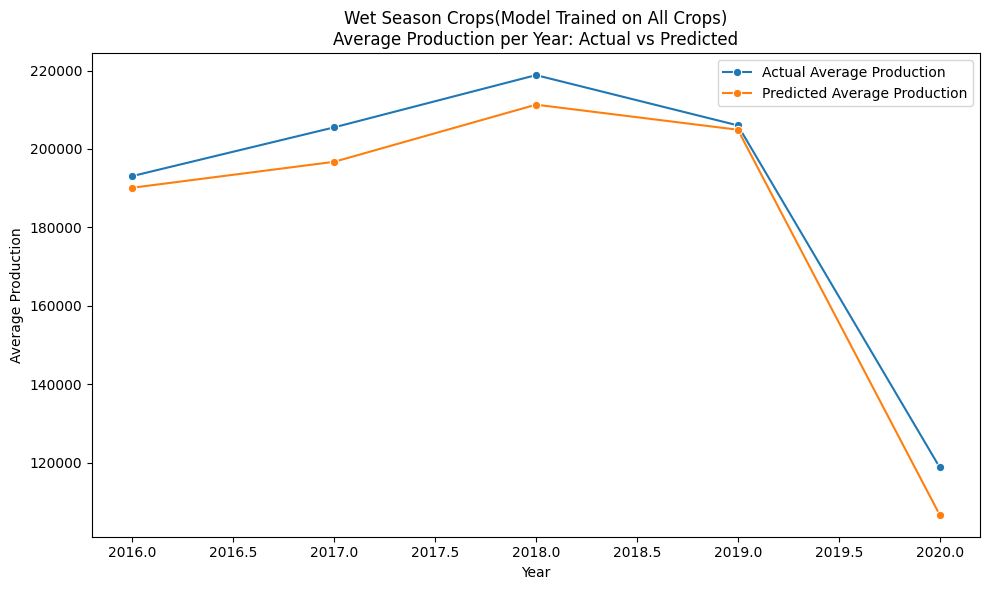

Mean Squared Error (New Data): 10295683758.677824
Root Mean Squared Error (New Data): 101467.6488279778
Mean Absolute Error (New Data): 48564.10034754018
R² (New Data): 0.9003230932848065
Adjusted R² (New Data): 0.8984847896773542


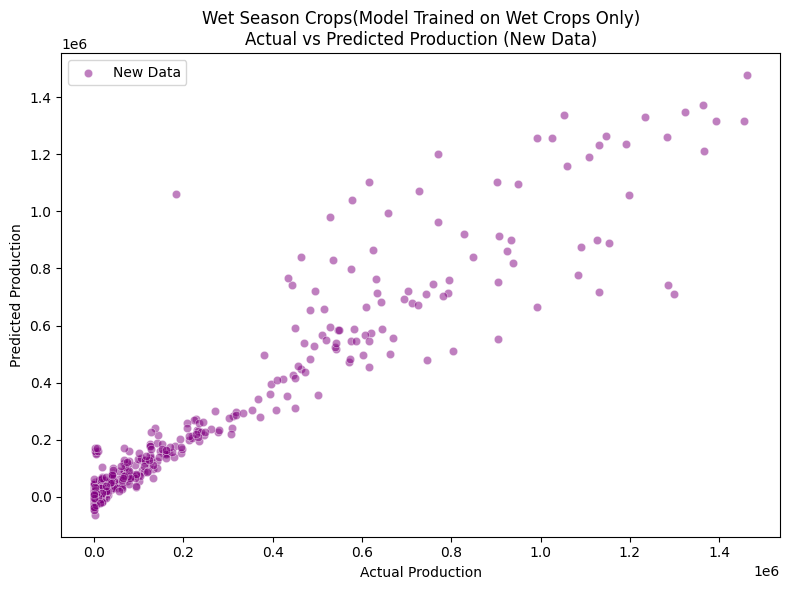

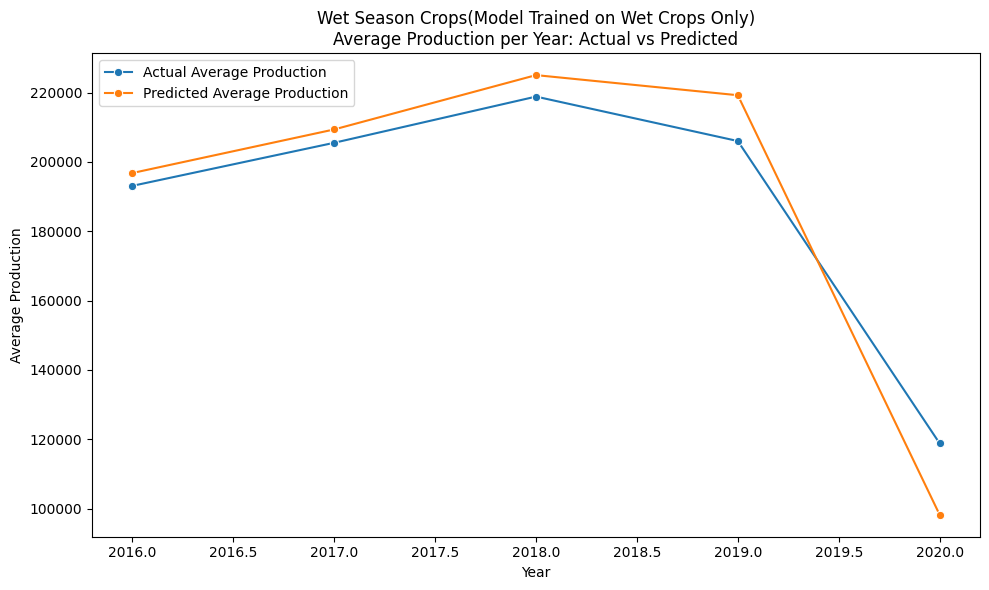

In [53]:
# Load the model and scaler
wet_trained_model = joblib.load('wet_trained_model.pkl')
wet_target_scaler = joblib.load('wet_target_scaler.pkl')

# Prepare new data
X_new = wet_season_crops_test.drop(['Yield', 'Production'], axis=1)
y_new_actual = wet_season_crops_test['Production']

# Predict on new data
new_predictions_scaled = crop_trained_model.predict(X_new)
new_predictions = crop_target_scaler.inverse_transform(new_predictions_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_new = mean_squared_error(y_new_actual, new_predictions)
rmse_new = np.sqrt(mse_new)
mae_new = mean_absolute_error(y_new_actual, new_predictions)
r2_new = r2_score(y_new_actual, new_predictions)

def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_new = X_new.shape[0]
p = X_new.shape[1]
adjusted_r2_new = adjusted_r2(r2_new, n_new, p)

print("Mean Squared Error (New Data):", mse_new)
print("Root Mean Squared Error (New Data):", rmse_new)
print("Mean Absolute Error (New Data):", mae_new)
print("R² (New Data):", r2_new)
print("Adjusted R² (New Data):", adjusted_r2_new)

# Plot actual vs predicted values
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_new_actual, y=new_predictions, color='purple', label='New Data', alpha=0.5)
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Wet Season Crops(Model Trained on All Crops)\nActual vs Predicted Production (New Data)')
plt.legend()

plt.tight_layout()
plt.show()

# Calculate average yield for each year for actual and predicted data
wet_season_crops_test['Predicted_Production'] = new_predictions

actual_avg_production_per_year = wet_season_crops_test.groupby('Crop_Year')['Production'].mean()
predicted_avg_production_per_year = wet_season_crops_test.groupby('Crop_Year')['Predicted_Production'].mean()

# Create a DataFrame to store the averages
avg_production_per_year = pd.DataFrame({
    'Actual_Avg_Production': actual_avg_production_per_year,
    'Predicted_Avg_Production': predicted_avg_production_per_year
}).reset_index()

# Plot the average yield for each year
plt.figure(figsize=(10, 6))
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=avg_production_per_year, marker='o', label='Actual Average Production')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=avg_production_per_year, marker='o', label='Predicted Average Production')

plt.xlabel('Year')
plt.ylabel('Average Production')
plt.title('Wet Season Crops(Model Trained on All Crops)\nAverage Production per Year: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()

''''''''''''''''''''''''''''''
# Load the model and scaler
wet_trained_model = joblib.load('wet_trained_model.pkl')
wet_target_scaler = joblib.load('wet_target_scaler.pkl')

# Prepare new data
X_new = wet_season_crops_test.drop(['Yield', 'Production'], axis=1)
y_new_actual = wet_season_crops_test['Production']

# Predict on new data
new_predictions_scaled = wet_trained_model.predict(X_new)
new_predictions = wet_target_scaler.inverse_transform(new_predictions_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_new = mean_squared_error(y_new_actual, new_predictions)
rmse_new = np.sqrt(mse_new)
mae_new = mean_absolute_error(y_new_actual, new_predictions)
r2_new = r2_score(y_new_actual, new_predictions)

def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_new = X_new.shape[0]
p = X_new.shape[1]
adjusted_r2_new = adjusted_r2(r2_new, n_new, p)

print("Mean Squared Error (New Data):", mse_new)
print("Root Mean Squared Error (New Data):", rmse_new)
print("Mean Absolute Error (New Data):", mae_new)
print("R² (New Data):", r2_new)
print("Adjusted R² (New Data):", adjusted_r2_new)

# Plot actual vs predicted values
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_new_actual, y=new_predictions, color='purple', label='New Data', alpha=0.5)
plt.xlabel('Actual Production')
plt.ylabel('Predicted Production')
plt.title('Wet Season Crops(Model Trained on Wet Crops Only)\nActual vs Predicted Production (New Data)')
plt.legend()

plt.tight_layout()
plt.show()

# Calculate average yield for each year for actual and predicted data
wet_season_crops_test['Predicted_Production'] = new_predictions

actual_avg_production_per_year = wet_season_crops_test.groupby('Crop_Year')['Production'].mean()
predicted_avg_production_per_year = wet_season_crops_test.groupby('Crop_Year')['Predicted_Production'].mean()

# Create a DataFrame to store the averages
avg_production_per_year = pd.DataFrame({
    'Actual_Avg_Production': actual_avg_production_per_year,
    'Predicted_Avg_Production': predicted_avg_production_per_year
}).reset_index()

# Plot the average yield for each year
plt.figure(figsize=(10, 6))
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=avg_production_per_year, marker='o', label='Actual Average Production')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=avg_production_per_year, marker='o', label='Predicted Average Production')

plt.xlabel('Year')
plt.ylabel('Average Production')
plt.title('Wet Season Crops(Model Trained on Wet Crops Only)\nAverage Production per Year: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()

## Predicting by individual crops

In [54]:
# Create new dataframes for dry/wet crops, grouped by crop type and year

# Dry train dataframe
dry_crops_by_year_train = dry_season_crops_train.groupby(['Crop', 'Crop_Year'])['Yield'].mean().reset_index()

# Dry test dataframe
dry_crops_by_year_test = dry_season_crops_test.groupby(['Crop', 'Crop_Year'])['Yield'].mean().reset_index()

# Wet train dataframe
wet_crops_by_year_train = wet_season_crops_train.groupby(['Crop', 'Crop_Year'])['Yield'].mean().reset_index()

# Wet test dataframe
wet_crops_by_year_test = wet_season_crops_test.groupby(['Crop', 'Crop_Year'])['Yield'].mean().reset_index()

### Predicting Dry

Mean Squared Error (New Data): 2833179426.03889
Root Mean Squared Error (New Data): 53227.61901530905
Mean Absolute Error (New Data): 27619.223257812147
R² (New Data): 0.9589515771313141
Adjusted R² (New Data): 0.955766785701847


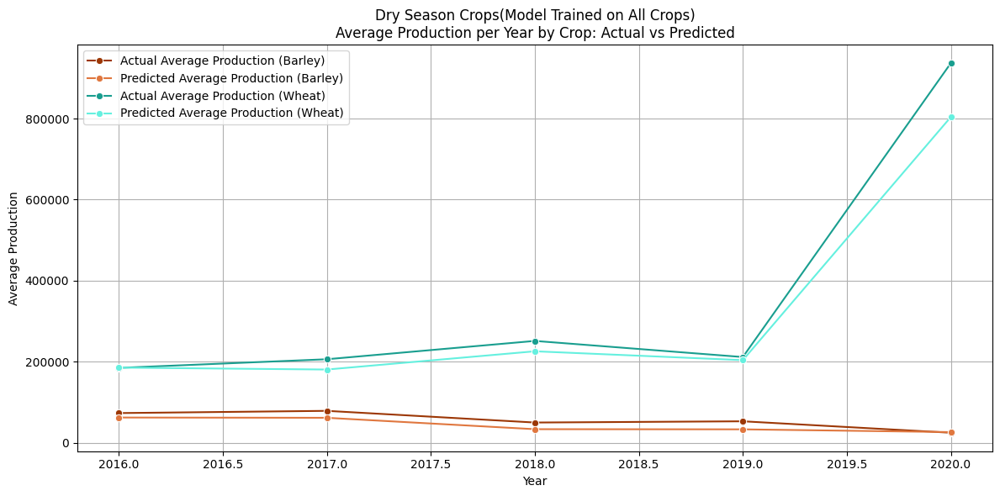

Mean Squared Error (New Data): 3049972883.9897575
Root Mean Squared Error (New Data): 55226.559588568954
Mean Absolute Error (New Data): 32337.242728230653
R² (New Data): 0.9558105725569679
Adjusted R² (New Data): 0.9523820824967326


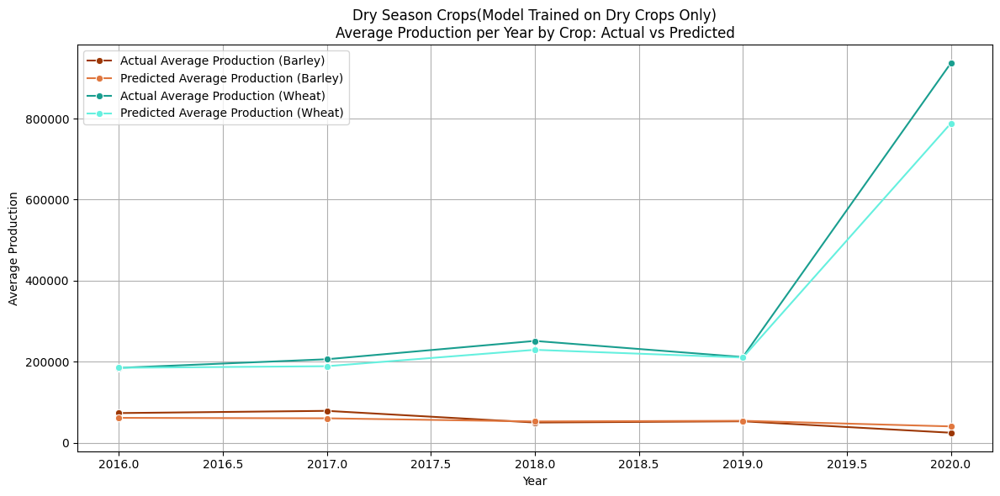

In [55]:
# Load the model and scaler
dry_trained_model = joblib.load('dry_trained_model.pkl')
dry_target_scaler = joblib.load('dry_target_scaler.pkl')

# Prepare new data
X_new = dry_season_crops_test.drop(['Yield', 'Production'], axis=1)
y_new_actual = dry_season_crops_test['Production']

# Predict on new data
new_predictions_scaled = crop_trained_model.predict(X_new)
new_predictions = crop_target_scaler.inverse_transform(new_predictions_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_new = mean_squared_error(y_new_actual, new_predictions)
rmse_new = np.sqrt(mse_new)
mae_new = mean_absolute_error(y_new_actual, new_predictions)
r2_new = r2_score(y_new_actual, new_predictions)

def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_new = X_new.shape[0]
p = X_new.shape[1]
adjusted_r2_new = adjusted_r2(r2_new, n_new, p)

print("Mean Squared Error (New Data):", mse_new)
print("Root Mean Squared Error (New Data):", rmse_new)
print("Mean Absolute Error (New Data):", mae_new)
print("R² (New Data):", r2_new)
print("Adjusted R² (New Data):", adjusted_r2_new)

# Calculate average yield for each year for actual and predicted data
dry_season_crops_test['Predicted_Production'] = new_predictions

actual_avg_production_per_year = dry_season_crops_test.groupby(['Crop', 'Crop_Year'])['Production'].mean()
predicted_avg_production_per_year = dry_season_crops_test.groupby(['Crop', 'Crop_Year'])['Predicted_Production'].mean()

# Create a DataFrame to store the averages
avg_production_per_year = pd.DataFrame({
    'Actual_Avg_Production': actual_avg_production_per_year,
    'Predicted_Avg_Production': predicted_avg_production_per_year
}).reset_index()

# Filter the DataFrame for Barley and Wheat
barley_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Barley']
wheat_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Wheat']

# Plot average and predicted yield by crop
plt.figure(figsize=(12, 6))
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=barley_data, marker='o', label='Actual Average Production (Barley)', color = '#9c3705')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=barley_data, marker='o', label='Predicted Average Production (Barley)', color = '#e0773f')
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=wheat_data, marker='o', label='Actual Average Production (Wheat)', color = '#199e8f')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=wheat_data, marker='o', label='Predicted Average Production (Wheat)', color = '#65f0df')
plt.grid(True)
plt.xlabel('Year')
plt.ylabel('Average Production')
plt.title('Dry Season Crops(Model Trained on All Crops)\nAverage Production per Year by Crop: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()

''''''''''''''''''''''''''
# Load the model and scaler
dry_trained_model = joblib.load('dry_trained_model.pkl')
dry_target_scaler = joblib.load('dry_target_scaler.pkl')

# Prepare new data
X_new = dry_season_crops_test.drop(['Yield', 'Production'], axis=1)
y_new_actual = dry_season_crops_test['Production']

# Predict on new data
new_predictions_scaled = dry_trained_model.predict(X_new)
new_predictions = dry_target_scaler.inverse_transform(new_predictions_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_new = mean_squared_error(y_new_actual, new_predictions)
rmse_new = np.sqrt(mse_new)
mae_new = mean_absolute_error(y_new_actual, new_predictions)
r2_new = r2_score(y_new_actual, new_predictions)

def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_new = X_new.shape[0]
p = X_new.shape[1]
adjusted_r2_new = adjusted_r2(r2_new, n_new, p)

print("Mean Squared Error (New Data):", mse_new)
print("Root Mean Squared Error (New Data):", rmse_new)
print("Mean Absolute Error (New Data):", mae_new)
print("R² (New Data):", r2_new)
print("Adjusted R² (New Data):", adjusted_r2_new)

# Calculate average yield for each year for actual and predicted data
dry_season_crops_test['Predicted_Production'] = new_predictions

actual_avg_production_per_year = dry_season_crops_test.groupby(['Crop', 'Crop_Year'])['Production'].mean()
predicted_avg_production_per_year = dry_season_crops_test.groupby(['Crop', 'Crop_Year'])['Predicted_Production'].mean()

# Create a DataFrame to store the averages
avg_production_per_year = pd.DataFrame({
    'Actual_Avg_Production': actual_avg_production_per_year,
    'Predicted_Avg_Production': predicted_avg_production_per_year
}).reset_index()

# Filter the DataFrame for Barley and Wheat
barley_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Barley']
wheat_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Wheat']

# Plot average and predicted yield by crop
plt.figure(figsize=(12, 6))
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=barley_data, marker='o', label='Actual Average Production (Barley)', color = '#9c3705')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=barley_data, marker='o', label='Predicted Average Production (Barley)', color = '#e0773f')
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=wheat_data, marker='o', label='Actual Average Production (Wheat)', color = '#199e8f')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=wheat_data, marker='o', label='Predicted Average Production (Wheat)', color = '#65f0df')
plt.grid(True)
plt.xlabel('Year')
plt.ylabel('Average Production')
plt.title('Dry Season Crops(Model Trained on Dry Crops Only)\nAverage Production per Year by Crop: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()

### Predicting Wet

Mean Squared Error (New Data): 8197177522.917584
Root Mean Squared Error (New Data): 90538.26551750141
Mean Absolute Error (New Data): 43511.30776725492
R² (New Data): 0.9206396273981258
Adjusted R² (New Data): 0.9191760139689928


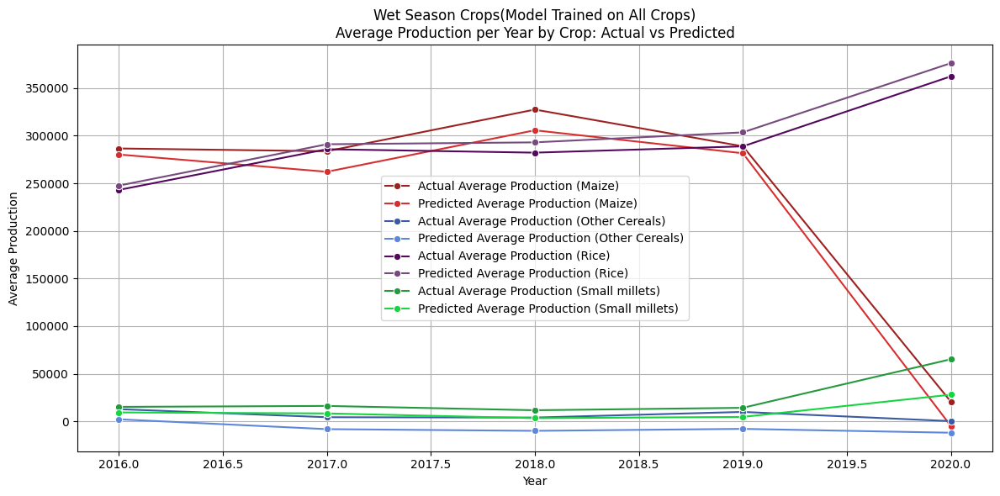

Mean Squared Error (New Data): 10295683758.677824
Root Mean Squared Error (New Data): 101467.6488279778
Mean Absolute Error (New Data): 48564.10034754018
R² (New Data): 0.9003230932848065
Adjusted R² (New Data): 0.8984847896773542


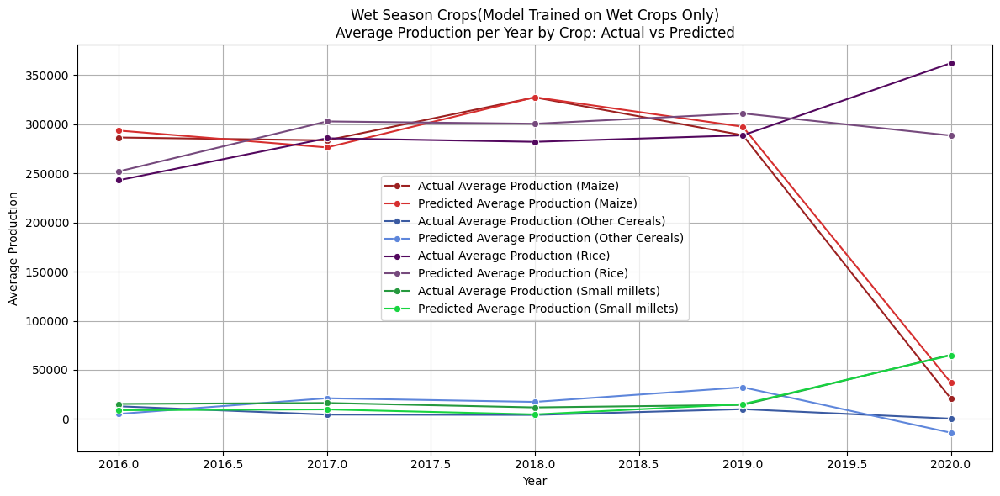

In [56]:
# Load the model and scaler
wet_trained_model = joblib.load('wet_trained_model.pkl')
wet_target_scaler = joblib.load('wet_target_scaler.pkl')

# Prepare new data
X_new = wet_season_crops_test.drop(['Yield', 'Production'], axis=1)
y_new_actual = wet_season_crops_test['Production']

# Predict on new data
new_predictions_scaled = crop_trained_model.predict(X_new)
new_predictions = crop_target_scaler.inverse_transform(new_predictions_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_new = mean_squared_error(y_new_actual, new_predictions)
rmse_new = np.sqrt(mse_new)
mae_new = mean_absolute_error(y_new_actual, new_predictions)
r2_new = r2_score(y_new_actual, new_predictions)

def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_new = X_new.shape[0]
p = X_new.shape[1]
adjusted_r2_new = adjusted_r2(r2_new, n_new, p)

print("Mean Squared Error (New Data):", mse_new)
print("Root Mean Squared Error (New Data):", rmse_new)
print("Mean Absolute Error (New Data):", mae_new)
print("R² (New Data):", r2_new)
print("Adjusted R² (New Data):", adjusted_r2_new)

# Calculate average yield for each year for actual and predicted data
wet_season_crops_test['Predicted_Production'] = new_predictions

actual_avg_production_per_year = wet_season_crops_test.groupby(['Crop', 'Crop_Year'])['Production'].mean()
predicted_avg_production_per_year = wet_season_crops_test.groupby(['Crop', 'Crop_Year'])['Predicted_Production'].mean()

# Create a DataFrame to store the averages
avg_production_per_year = pd.DataFrame({
    'Actual_Avg_Production': actual_avg_production_per_year,
    'Predicted_Avg_Production': predicted_avg_production_per_year
}).reset_index()

# Filter the DataFrame for Barley and Wheat
maize_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Maize']
other_cereals_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Other Cereals']
rice_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Rice']
small_millets_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Small millets']

# Plot average and predicted yield by crop
plt.figure(figsize=(12, 6))
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=maize_data, marker='o', label='Actual Average Production (Maize)', color = '#9c2121')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=maize_data, marker='o', label='Predicted Average Production (Maize)', color = '#d62f2f')
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=other_cereals_data, marker='o', label='Actual Average Production (Other Cereals)', color = '#3a5aa1')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=other_cereals_data, marker='o', label='Predicted Average Production (Other Cereals)', color = '#5e86db')
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=rice_data, marker='o', label='Actual Average Production (Rice)', color = '#53085e')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=rice_data, marker='o', label='Predicted Average Production (Rice)', color = '#764a7d')
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=small_millets_data, marker='o', label='Actual Average Production (Small millets)', color = '#25993e')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=small_millets_data, marker='o', label='Predicted Average Production (Small millets)', color = '#17d440')
plt.grid(True)
plt.xlabel('Year')
plt.ylabel('Average Production')
plt.title('Wet Season Crops(Model Trained on All Crops)\nAverage Production per Year by Crop: Actual vs Predicted')
plt.legend()
plt.tight_layout()
plt.show()

''''''''''''''''''''''''''''''
# Load the model and scaler
wet_trained_model = joblib.load('wet_trained_model.pkl')
wet_target_scaler = joblib.load('wet_target_scaler.pkl')

# Prepare new data
X_new = wet_season_crops_test.drop(['Yield', 'Production'], axis=1)
y_new_actual = wet_season_crops_test['Production']

# Predict on new data
new_predictions_scaled = wet_trained_model.predict(X_new)
new_predictions = wet_target_scaler.inverse_transform(new_predictions_scaled.reshape(-1, 1)).flatten()

# Calculate metrics
mse_new = mean_squared_error(y_new_actual, new_predictions)
rmse_new = np.sqrt(mse_new)
mae_new = mean_absolute_error(y_new_actual, new_predictions)
r2_new = r2_score(y_new_actual, new_predictions)

def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_new = X_new.shape[0]
p = X_new.shape[1]
adjusted_r2_new = adjusted_r2(r2_new, n_new, p)

print("Mean Squared Error (New Data):", mse_new)
print("Root Mean Squared Error (New Data):", rmse_new)
print("Mean Absolute Error (New Data):", mae_new)
print("R² (New Data):", r2_new)
print("Adjusted R² (New Data):", adjusted_r2_new)

# Calculate average yield for each year for actual and predicted data
wet_season_crops_test['Predicted_Production'] = new_predictions

actual_avg_production_per_year = wet_season_crops_test.groupby(['Crop', 'Crop_Year'])['Production'].mean()
predicted_avg_production_per_year = wet_season_crops_test.groupby(['Crop', 'Crop_Year'])['Predicted_Production'].mean()

# Create a DataFrame to store the averages
avg_production_per_year = pd.DataFrame({
    'Actual_Avg_Production': actual_avg_production_per_year,
    'Predicted_Avg_Production': predicted_avg_production_per_year
}).reset_index()

# Filter the DataFrame for Barley and Wheat
maize_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Maize']
other_cereals_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Other Cereals']
rice_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Rice']
small_millets_data = avg_production_per_year[avg_production_per_year['Crop'] == 'Small millets']

# Plot average and predicted yield by crop
plt.figure(figsize=(12, 6))
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=maize_data, marker='o', label='Actual Average Production (Maize)', color = '#9c2121')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=maize_data, marker='o', label='Predicted Average Production (Maize)', color = '#d62f2f')
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=other_cereals_data, marker='o', label='Actual Average Production (Other Cereals)', color = '#3a5aa1')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=other_cereals_data, marker='o', label='Predicted Average Production (Other Cereals)', color = '#5e86db')
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=rice_data, marker='o', label='Actual Average Production (Rice)', color = '#53085e')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=rice_data, marker='o', label='Predicted Average Production (Rice)', color = '#764a7d')
sns.lineplot(x='Crop_Year', y='Actual_Avg_Production', data=small_millets_data, marker='o', label='Actual Average Production (Small millets)', color = '#25993e')
sns.lineplot(x='Crop_Year', y='Predicted_Avg_Production', data=small_millets_data, marker='o', label='Predicted Average Production (Small millets)', color = '#17d440')
plt.grid(True)
plt.xlabel('Year')
plt.ylabel('Average Production')
plt.title('Wet Season Crops(Model Trained on Wet Crops Only)\nAverage Production per Year by Crop: Actual vs Predicted')
plt.legend()
plt.tight_layout()
plt.show()

# Conclusion

## The insights we can gain from these models is promising. Across the board the models performed well. Some performed slightly better when trained on data from all the crops and some better when trained only on data from their specific crop groups(i.e. cereal, wet season, dry season). However, the important thing to note is that the differences in performance accuracy are minute and any of these models would prove useful for crop production prediction as we see high accuracy being boasted by all models across the board.